### Esercitazione 24 - Strategia su Profili Volumetrici
#### Argomenti

* Utilizzo di una libreria per il calcolo dei valori relativi ai profili volumetrici
* Implementazione di una semplice strategia che sfrutta i livelli di prezzo generati dall'analisi dei profili volumetrici

In [2]:
from Historic_Crypto import HistoricalData
from datetime import datetime, timedelta
import numpy as np
import pickle
import matplotlib.pyplot as plt
from market_profile import MarketProfile
import pandas as pd
import seaborn as sns

In [2]:
end_date = datetime.now()
start_date = end_date - timedelta(days=120)
candles = HistoricalData(
    ticker='BTC-USD',
    granularity=60 * 1,
    start_date=start_date.strftime('%Y-%m-%d-%H-%M'),
    end_date=end_date.strftime('%Y-%m-%d-%H-%M'),
    verbose=False
).retrieve_data()

Provisional Start: 2022-08-15T19:16:00
Provisional End: 2022-08-16T00:16:00
Provisional Start: 2022-08-16T00:16:00
Provisional End: 2022-08-16T05:16:00
Provisional Start: 2022-08-16T05:16:00
Provisional End: 2022-08-16T10:16:00
Provisional Start: 2022-08-16T10:16:00
Provisional End: 2022-08-16T15:16:00
Provisional Start: 2022-08-16T15:16:00
Provisional End: 2022-08-16T20:16:00
Provisional Start: 2022-08-16T20:16:00
Provisional End: 2022-08-17T01:16:00
Provisional Start: 2022-08-17T01:16:00
Provisional End: 2022-08-17T06:16:00
Provisional Start: 2022-08-17T06:16:00
Provisional End: 2022-08-17T11:16:00
Provisional Start: 2022-08-17T11:16:00
Provisional End: 2022-08-17T16:16:00


KeyboardInterrupt: 

In [ ]:
pickle.dump(candles, open('BTC-USD_M1.pck', 'wb'))

In [3]:
candles = pickle.load(open('BTC-USD_M1.pck', 'rb'))

In [3]:
# cambio iniziale alle colonne del dataframe [candles]
# per compatibilità con MaketProfile
candles.rename(columns={'close': 'Close', 'open': 'Open', 'high': 'High', 'low': 'Low', 'volume': 'Volume'}, inplace=True)

In [4]:
mp = MarketProfile(candles['2022-11-01':'2022-11-05'])

mp_slice = mp['2022-11-04':]

print('profilo volumetrico', mp_slice.profile)
print('---')
print('livelli iniziali', mp_slice.initial_balance())
print('livelli di apertura', mp_slice.open_range())
print('punto di controllo', mp_slice.poc_price)
print('intervallo del profilo volumetrico', mp_slice.profile_range)
print('area 70% più battuta', mp_slice.value_area)
print('livello target bilanciato', mp_slice.balanced_target)
print('---')
print('livelli minimi più battuti', mp_slice.low_value_nodes)
print('livelli massimi più battuti', mp_slice.high_value_nodes)

profilo volumetrico Close
20185.00    38.355910
20189.40     7.405957
20189.75    28.198731
20189.95    10.072422
20190.15     7.213709
              ...    
21463.15    12.270602
21464.80    21.587336
21465.00    63.986038
21466.50    88.670390
21470.60     8.019120
Name: Volume, Length: 2547, dtype: float64
---
livelli iniziali (20181.61, 20305.23)
livelli di apertura (20181.61, 20215.47)
punto di controllo 20734.3
intervallo del profilo volumetrico (20185.0, 21470.6)
area 70% più battuta (20320.8, 21224.75)
livello target bilanciato 19998.0
---
livelli minimi più battuti Close
20189.40     7.405957
20190.15     7.213709
20195.70    12.568459
20203.50     6.897674
20208.15     9.698505
              ...    
21454.95     2.850764
21458.60     3.816225
21460.40     5.130574
21461.65    10.792138
21463.15    12.270602
Name: Volume, Length: 841, dtype: float64
livelli massimi più battuti Close
20189.75    28.198731
20194.85    21.739869
20198.15    19.626440
20205.35    15.462487
20212.8

In [5]:
# creazione di una procedura per creare più grafici di profili volumetrici
# calcolati su diversi intervalli temporali e validazione dei singoli
# intevalli tramite l'applicazione di una semplice strategia sui picchi
# riscontrati per il segnale [balanced_target]

# impostazioni iniziali
giorni_simulazione = 3
data_inizio_dataset = candles.index[0] + timedelta(days=1, hours=12, minutes=1) # per l'intervallo da 36h usato successivamente
data_fine_dataset = candles.index[-1] - timedelta(days=giorni_simulazione, minutes=1) # per garantire il numero di candele necessario alle simulazioni
delta_date = data_fine_dataset - data_inizio_dataset
int_delta_date = (delta_date.days * 24 * 60 * 60) + delta_date.seconds

date_inizio_test = []
for _ in range(10):
    date_inizio_test.append(data_inizio_dataset + timedelta(seconds=np.random.randint(int_delta_date)))

# intervalli su cui calcolare i profili volumetrici
ore_da_testare = [0.1, 0.2, 0.33, 0.5, 0.75, 1, 1.5, 2, 3, 4, 6, 8, 10, 12, 18, 24, 36]

# log dei risultati
dizionario_risultati = {
    'ore_di_addestramento': [],
    'vincite': [],
    'vincite_max': [],
    'vincite_min': [],
    'vincite_percentuale': [],
    'giocate': [],
    'portafoglio': [],
    'portafoglio_max': [],
    'portafoglio_min': [],
    'portafoglio_percentuale': []
}

inizio simulazione su 17 configurazioni diverse.
giorni per ogni singola simulazione: 3 iniziando dalle date: [Timestamp('2022-11-06 14:42:08'), Timestamp('2022-09-11 17:06:48'), Timestamp('2022-08-28 16:40:41'), Timestamp('2022-10-13 07:32:47'), Timestamp('2022-10-07 13:16:10'), Timestamp('2022-09-09 01:06:31'), Timestamp('2022-08-20 20:26:40'), Timestamp('2022-11-27 10:09:59'), Timestamp('2022-10-18 07:39:02'), Timestamp('2022-11-18 08:15:24')]
--------------------------------------------------
                     1 / 17
--------------------------------------------------
addestramento su: 0.1 ore, partendo da 2022-11-06 14:42:08  portafoglio: -1233.15 -> -6.01% - vincite: 212 / 398 -> 53.26%


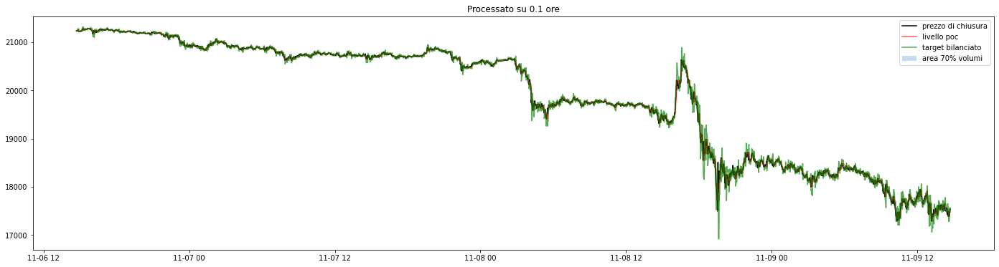

addestramento su: 0.1 ore, partendo da 2022-09-11 17:06:48  portafoglio: 905.65 -> 4.17% - vincite: 196 / 387 -> 50.64%


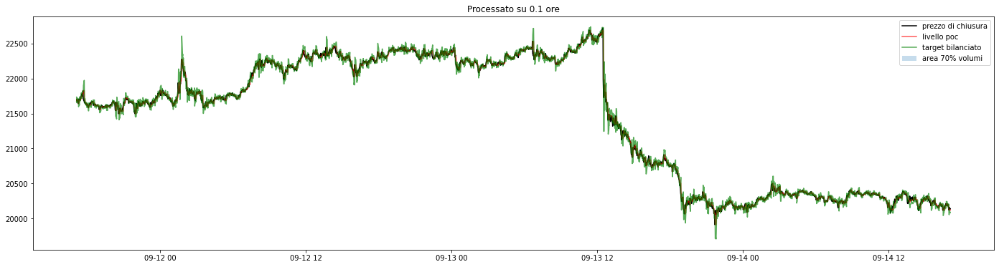

addestramento su: 0.1 ore, partendo da 2022-08-28 16:40:41  portafoglio: -812.06 -> -4.03% - vincite: 203 / 392 -> 51.78%


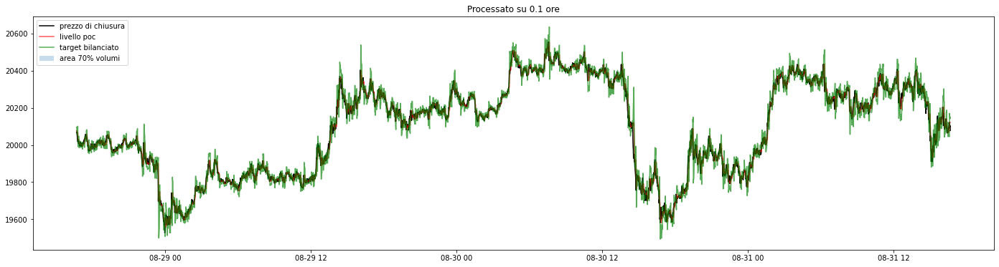

addestramento su: 0.1 ore, partendo da 2022-10-13 07:32:47  portafoglio: -407.41 -> -2.12% - vincite: 219 / 409 -> 53.54%


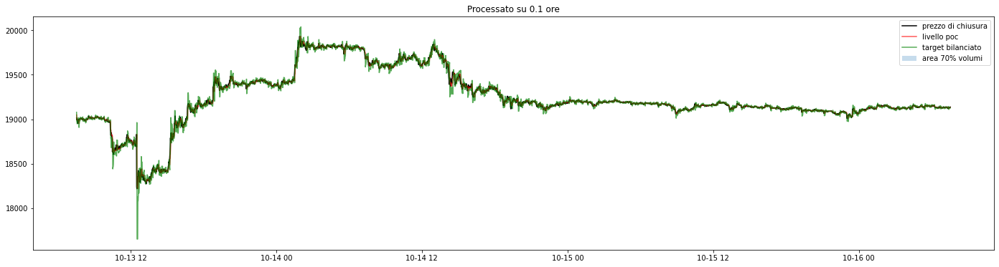

addestramento su: 0.1 ore, partendo da 2022-10-07 13:16:10  portafoglio: 303.87 -> 1.56% - vincite: 222 / 392 -> 56.63%


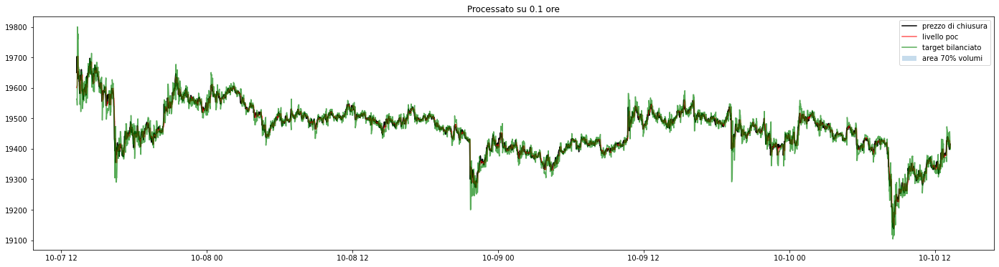

addestramento su: 0.1 ore, partendo da 2022-09-09 01:06:31  portafoglio: 589.24 -> 2.75% - vincite: 215 / 394 -> 54.56%


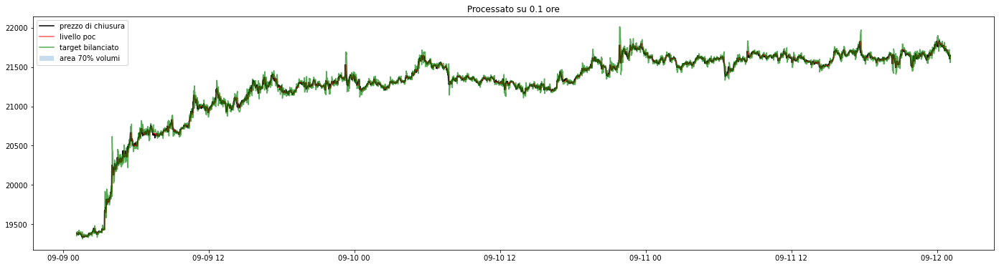

addestramento su: 0.1 ore, partendo da 2022-08-20 20:26:40  portafoglio: -1086.84 -> -5.09% - vincite: 197 / 399 -> 49.37%


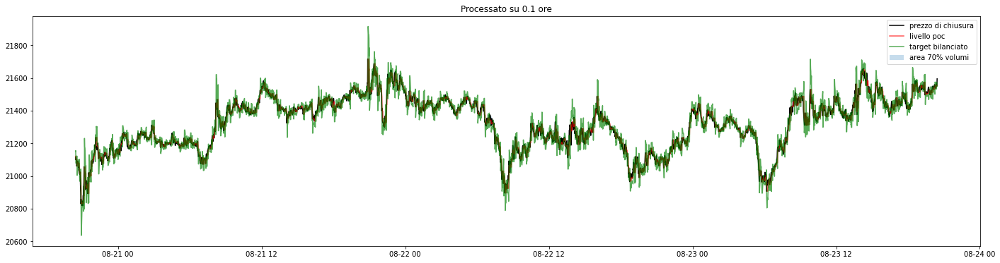

addestramento su: 0.1 ore, partendo da 2022-11-27 10:09:59  portafoglio: -553.51 -> -3.36% - vincite: 219 / 390 -> 56.15%


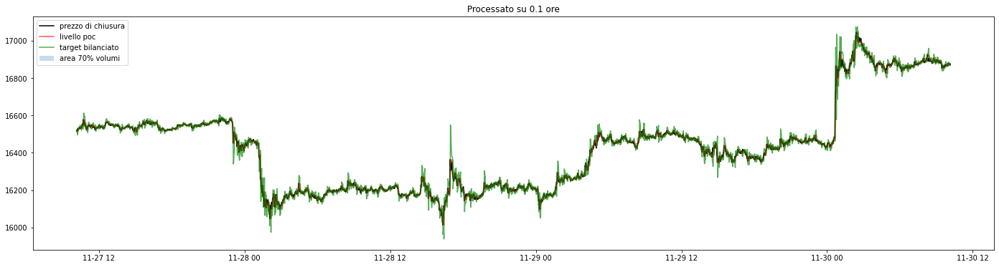

addestramento su: 0.1 ore, partendo da 2022-10-18 07:39:02  portafoglio: -394.28 -> -2.05% - vincite: 202 / 384 -> 52.6%


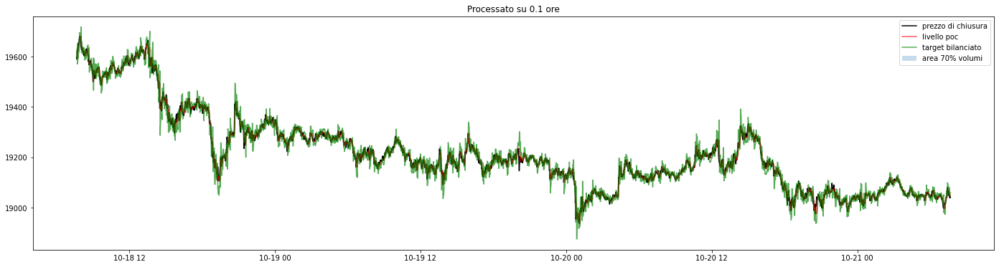

addestramento su: 0.1 ore, partendo da 2022-11-18 08:15:24  portafoglio: 153.34 -> 0.92% - vincite: 215 / 385 -> 55.84%


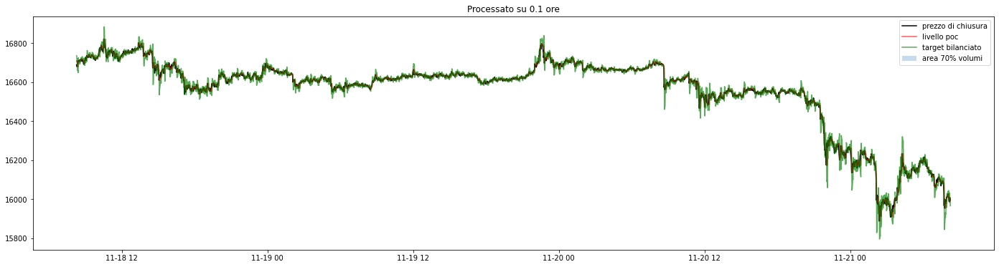

--------------------------------------------------
portafoglio: -253.51 -> -1.29%
vincite: 210.0 / 393.0 53.43%
--------------------------------------------------


--------------------------------------------------
                     2 / 17
--------------------------------------------------
addestramento su: 0.2 ore, partendo da 2022-11-06 14:42:08  portafoglio: -2692.74 -> -13.14% - vincite: 120 / 204 -> 58.82%


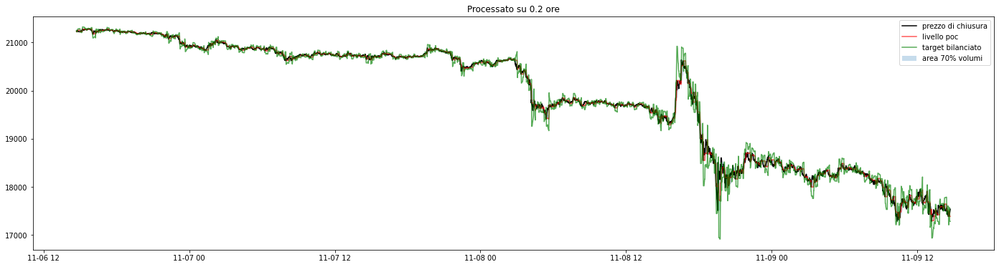

addestramento su: 0.2 ore, partendo da 2022-09-11 17:06:48  portafoglio: 1574.57 -> 7.25% - vincite: 127 / 204 -> 62.25%


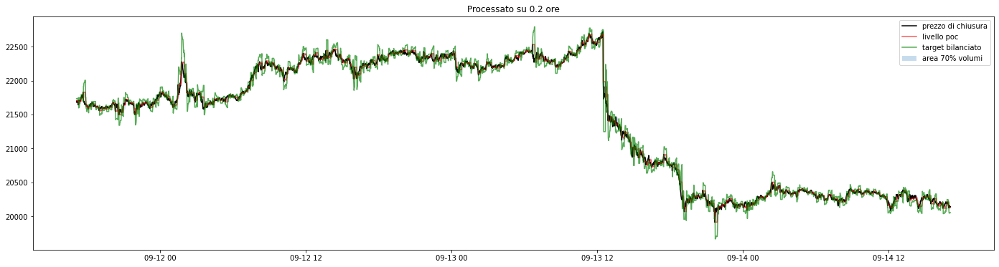

addestramento su: 0.2 ore, partendo da 2022-08-28 16:40:41  portafoglio: 261.27 -> 1.29% - vincite: 110 / 201 -> 54.72%


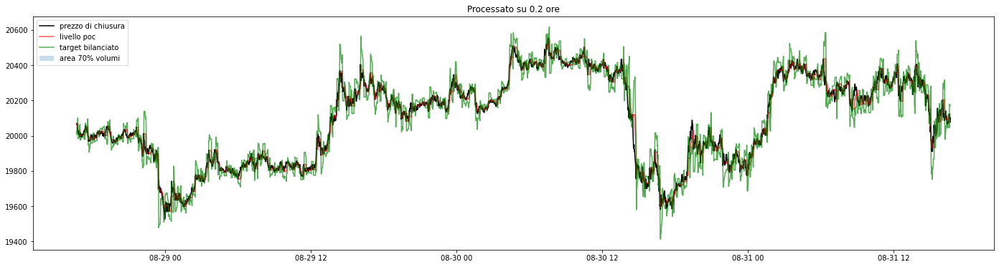

addestramento su: 0.2 ore, partendo da 2022-10-13 07:32:47  portafoglio: -1048.26 -> -5.46% - vincite: 128 / 214 -> 59.81%


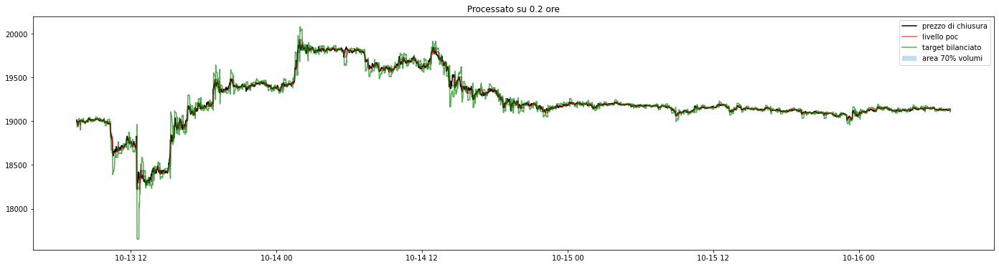

addestramento su: 0.2 ore, partendo da 2022-10-07 13:16:10  portafoglio: 476.48 -> 2.44% - vincite: 116 / 197 -> 58.88%


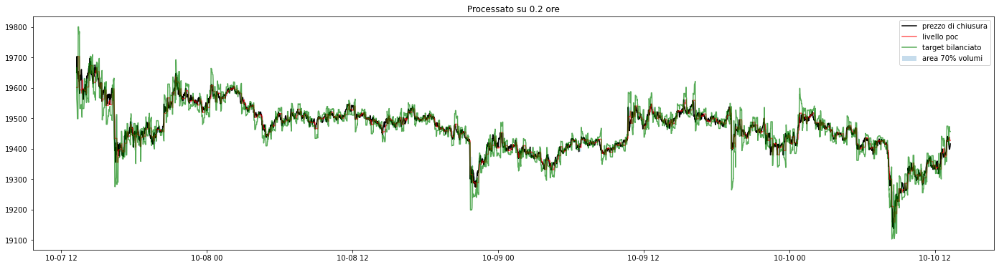

addestramento su: 0.2 ore, partendo da 2022-09-09 01:06:31  portafoglio: 862.1 -> 4.03% - vincite: 112 / 197 -> 56.85%


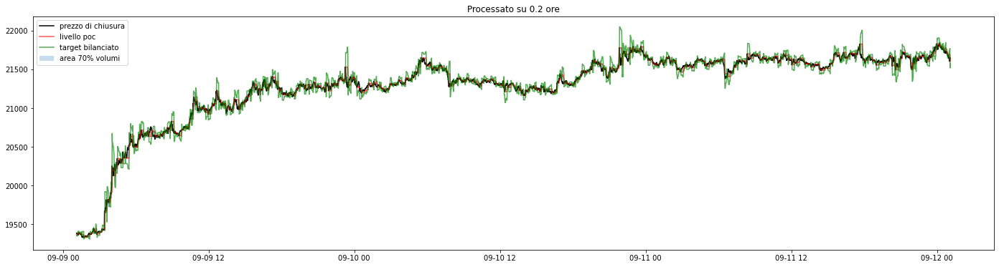

addestramento su: 0.2 ore, partendo da 2022-08-20 20:26:40  portafoglio: -462.37 -> -2.16% - vincite: 113 / 194 -> 58.24%


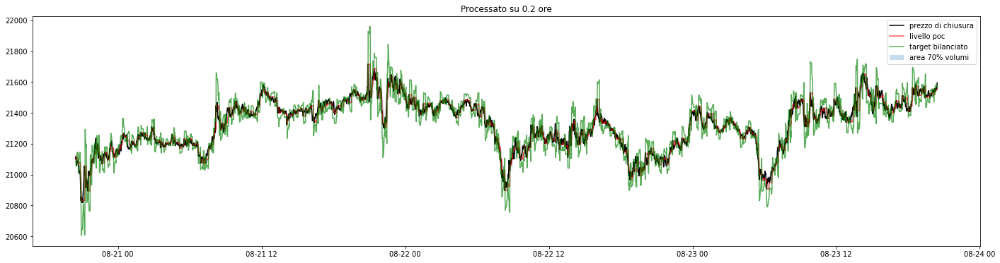

addestramento su: 0.2 ore, partendo da 2022-11-27 10:09:59  portafoglio: -287.92 -> -1.75% - vincite: 118 / 203 -> 58.12%


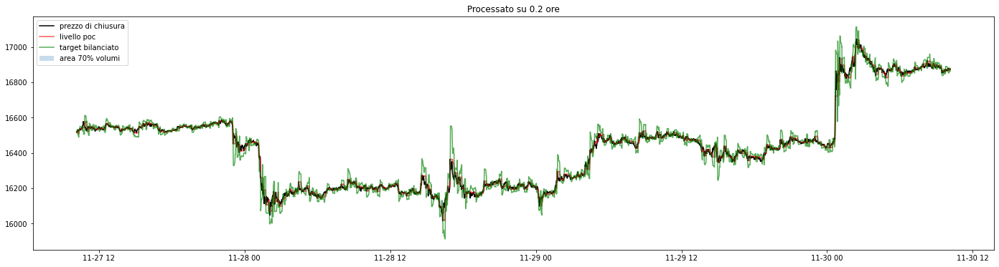

addestramento su: 0.2 ore, partendo da 2022-10-18 07:39:02  portafoglio: 117.71 -> 0.61% - vincite: 130 / 199 -> 65.32%


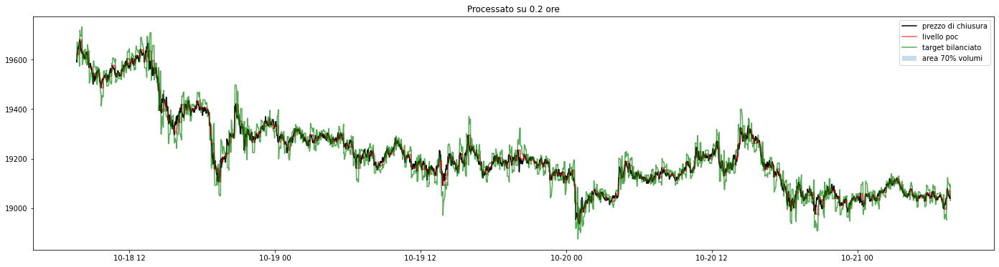

addestramento su: 0.2 ore, partendo da 2022-11-18 08:15:24  portafoglio: 282.24 -> 1.69% - vincite: 131 / 213 -> 61.5%


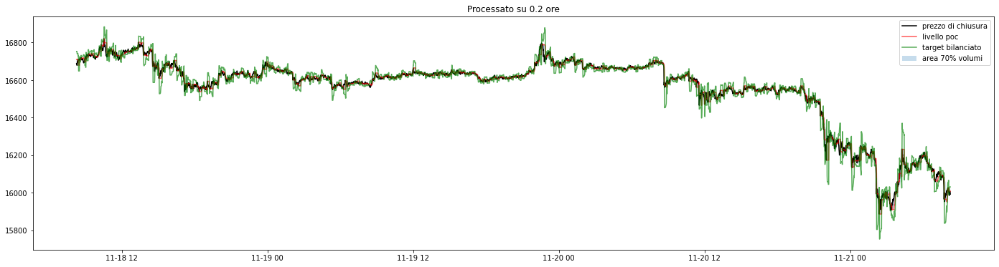

--------------------------------------------------
portafoglio: -91.68 -> -0.46%
vincite: 120.5 / 202.6 59.47%
--------------------------------------------------


--------------------------------------------------
                     3 / 17
--------------------------------------------------
addestramento su: 0.33 ore, partendo da 2022-11-06 14:42:08  portafoglio: -4060.82 -> -19.81% - vincite: 69 / 122 -> 56.55%


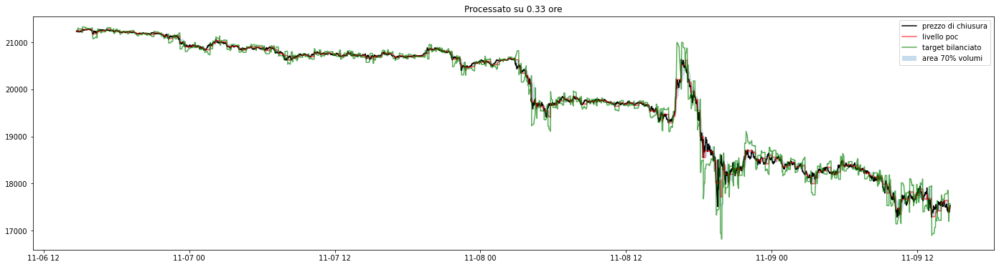

addestramento su: 0.33 ore, partendo da 2022-09-11 17:06:48  portafoglio: 1438.06 -> 6.62% - vincite: 78 / 129 -> 60.46%


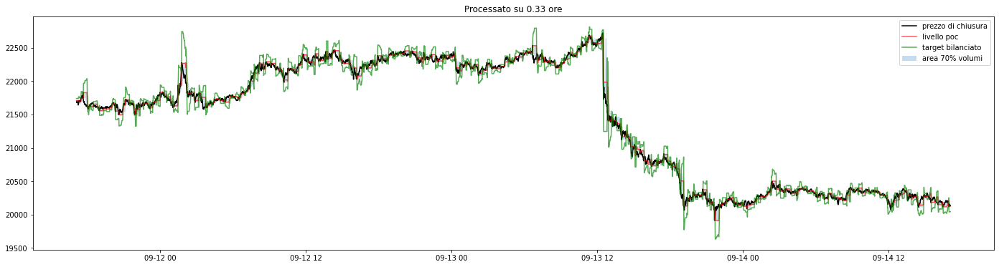

addestramento su: 0.33 ore, partendo da 2022-08-28 16:40:41  portafoglio: 277.57 -> 1.37% - vincite: 75 / 122 -> 61.47%


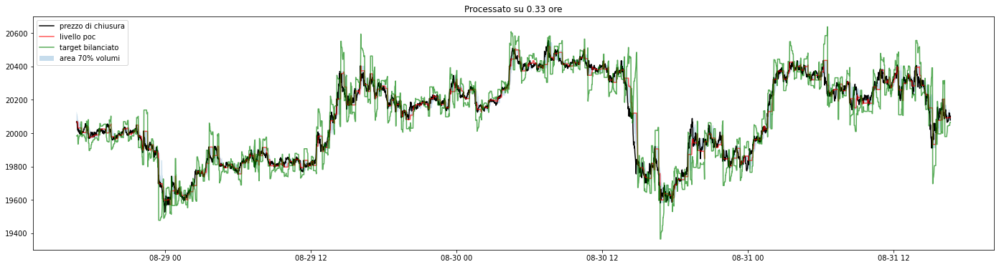

addestramento su: 0.33 ore, partendo da 2022-10-13 07:32:47  portafoglio: -1726.42 -> -9.0% - vincite: 70 / 126 -> 55.55%


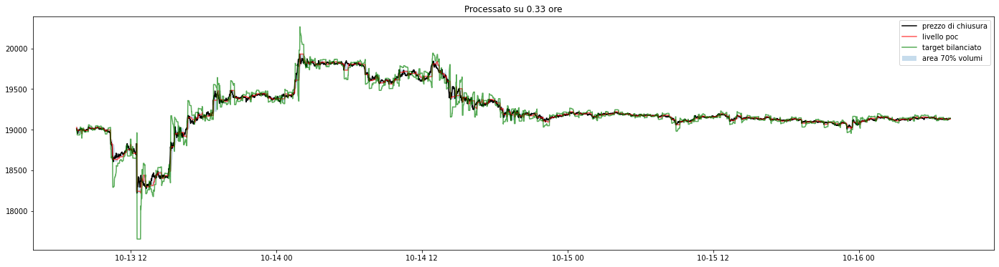

addestramento su: 0.33 ore, partendo da 2022-10-07 13:16:10  portafoglio: 318.34 -> 1.63% - vincite: 80 / 129 -> 62.01%


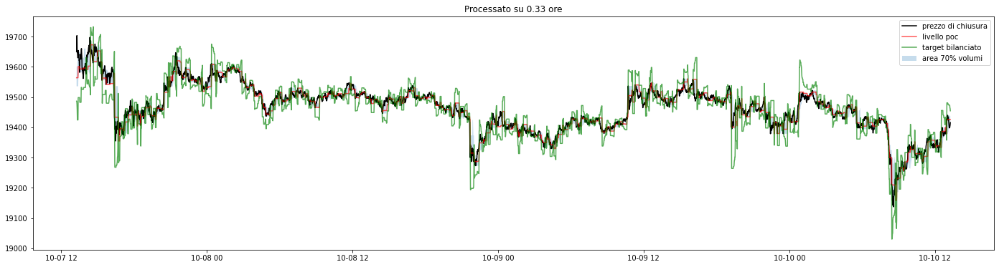

addestramento su: 0.33 ore, partendo da 2022-09-09 01:06:31  portafoglio: 408.65 -> 1.91% - vincite: 71 / 122 -> 58.19%


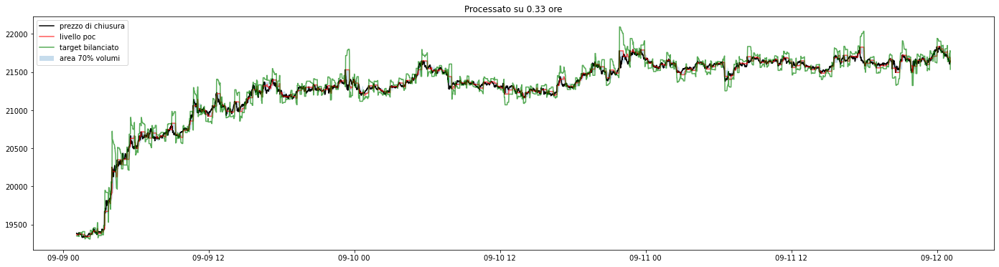

addestramento su: 0.33 ore, partendo da 2022-08-20 20:26:40  portafoglio: -56.04 -> -0.26% - vincite: 71 / 133 -> 53.38%


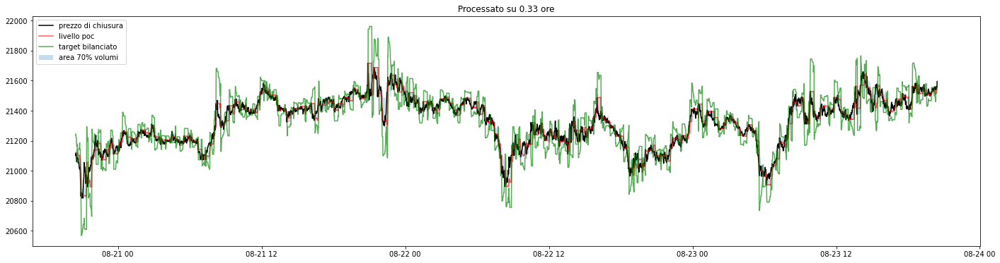

addestramento su: 0.33 ore, partendo da 2022-11-27 10:09:59  portafoglio: -218.14 -> -1.32% - vincite: 89 / 144 -> 61.8%


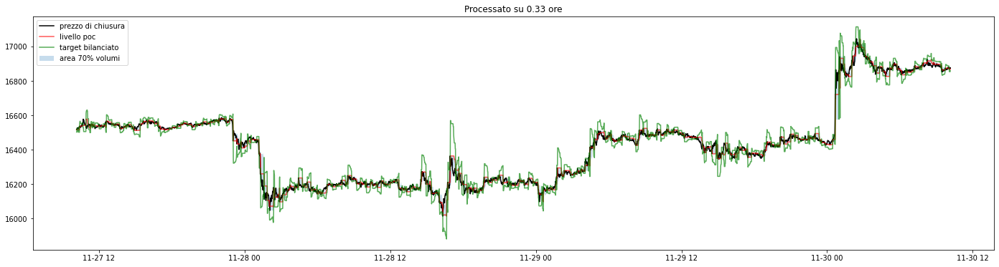

addestramento su: 0.33 ore, partendo da 2022-10-18 07:39:02  portafoglio: -24.55 -> -0.12% - vincite: 70 / 126 -> 55.55%


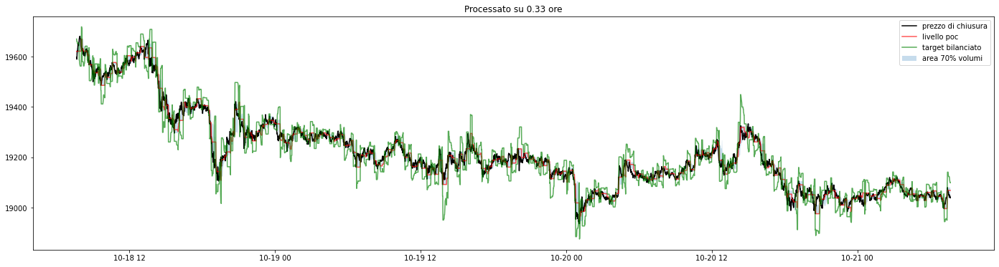

addestramento su: 0.33 ore, partendo da 2022-11-18 08:15:24  portafoglio: 412.88 -> 2.48% - vincite: 91 / 138 -> 65.94%


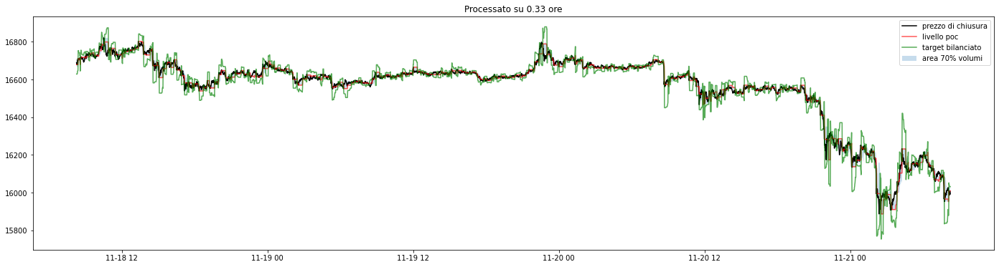

--------------------------------------------------
portafoglio: -323.04 -> -1.64%
vincite: 76.4 / 129.1 59.17%
--------------------------------------------------


--------------------------------------------------
                     4 / 17
--------------------------------------------------
addestramento su: 0.5 ore, partendo da 2022-11-06 14:42:08  portafoglio: -2528.96 -> -12.34% - vincite: 54 / 87 -> 62.06%


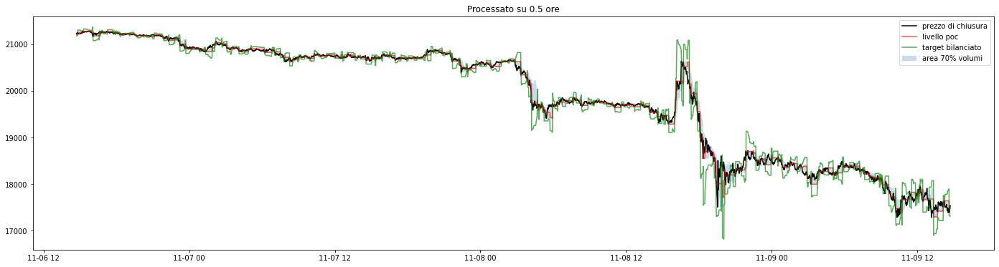

addestramento su: 0.5 ore, partendo da 2022-09-11 17:06:48  portafoglio: -191.64 -> -0.88% - vincite: 54 / 89 -> 60.67%


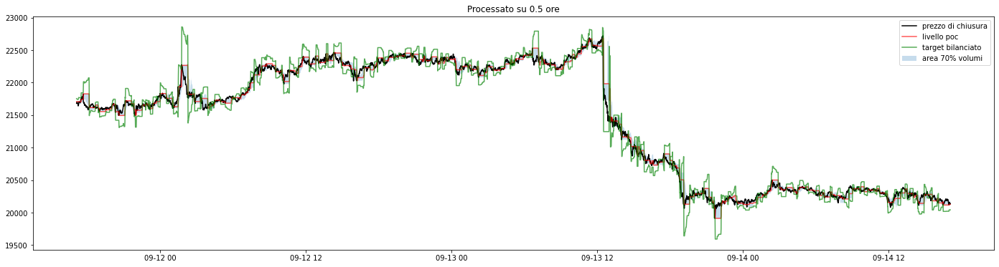

addestramento su: 0.5 ore, partendo da 2022-08-28 16:40:41  portafoglio: -325.16 -> -1.61% - vincite: 46 / 87 -> 52.87%


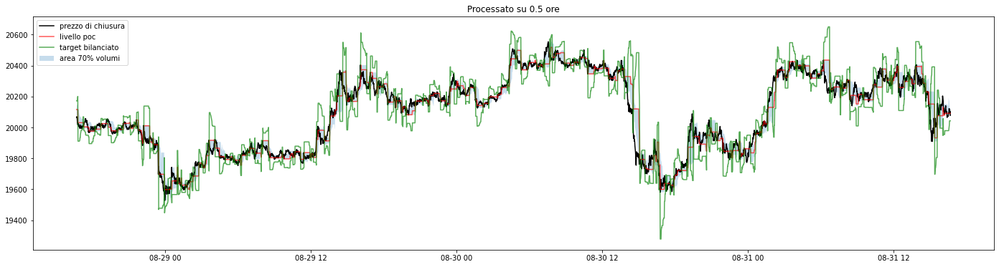

addestramento su: 0.5 ore, partendo da 2022-10-13 07:32:47  portafoglio: -1644.31 -> -8.57% - vincite: 36 / 80 -> 45.0%


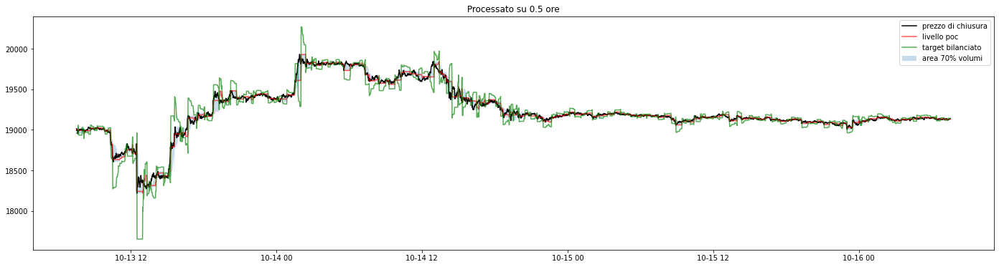

addestramento su: 0.5 ore, partendo da 2022-10-07 13:16:10  portafoglio: 423.29 -> 2.17% - vincite: 48 / 81 -> 59.25%


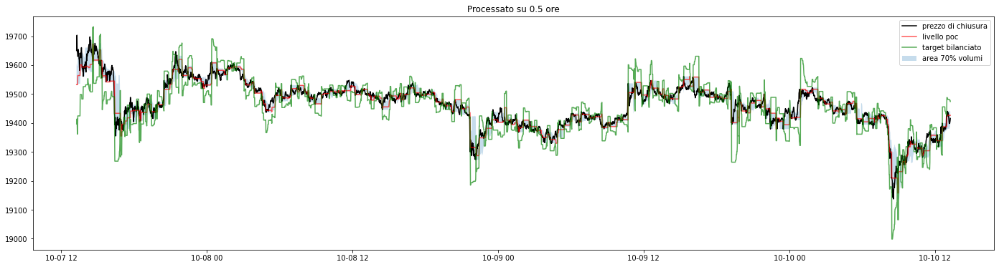

addestramento su: 0.5 ore, partendo da 2022-09-09 01:06:31  portafoglio: 645.27 -> 3.01% - vincite: 49 / 84 -> 58.33%


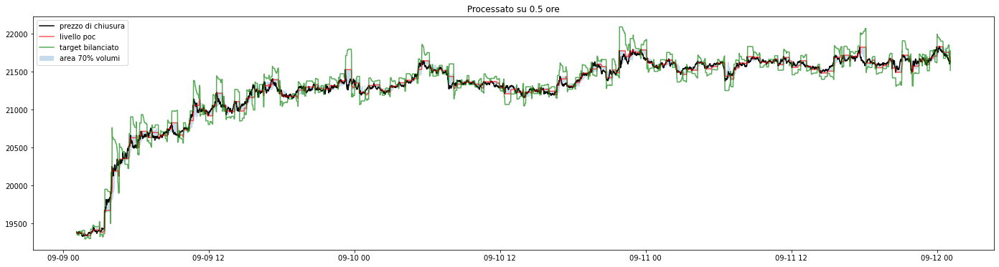

addestramento su: 0.5 ore, partendo da 2022-08-20 20:26:40  portafoglio: 134.06 -> 0.62% - vincite: 47 / 84 -> 55.95%


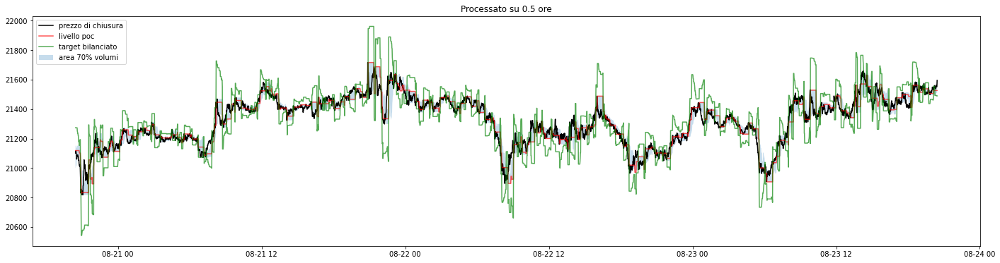

addestramento su: 0.5 ore, partendo da 2022-11-27 10:09:59  portafoglio: 170.31 -> 1.03% - vincite: 57 / 94 -> 60.63%


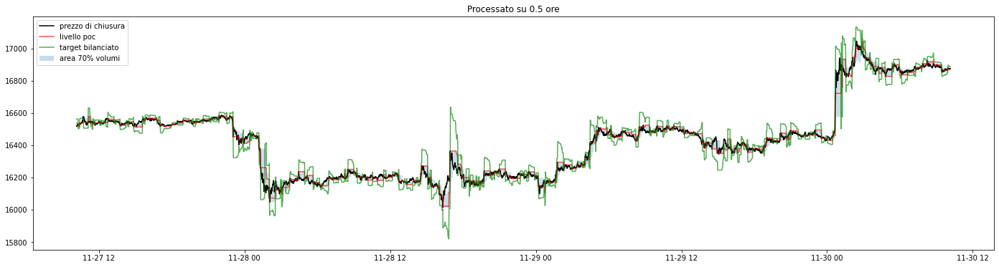

addestramento su: 0.5 ore, partendo da 2022-10-18 07:39:02  portafoglio: 473.48 -> 2.46% - vincite: 52 / 81 -> 64.19%


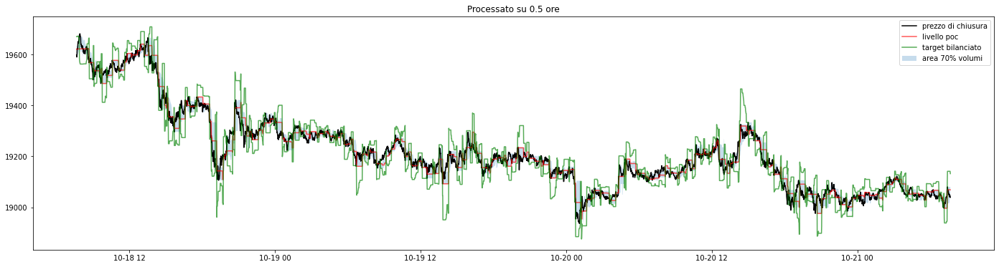

addestramento su: 0.5 ore, partendo da 2022-11-18 08:15:24  portafoglio: 10.67 -> 0.06% - vincite: 60 / 98 -> 61.22%


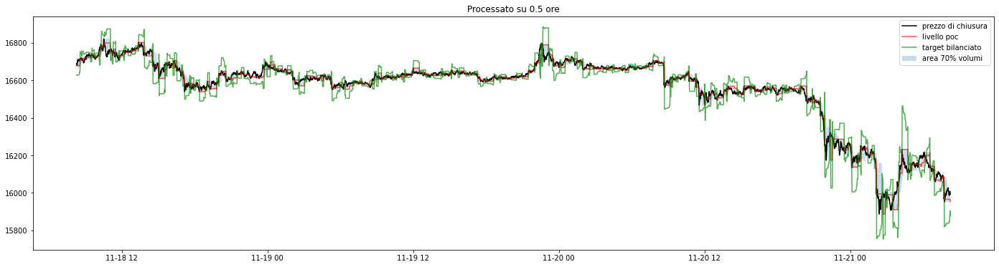

--------------------------------------------------
portafoglio: -283.29 -> -1.44%
vincite: 50.3 / 86.5 58.15%
--------------------------------------------------


--------------------------------------------------
                     5 / 17
--------------------------------------------------
addestramento su: 0.75 ore, partendo da 2022-11-06 14:42:08  portafoglio: -711.12 -> -3.47% - vincite: 36 / 59 -> 61.01%


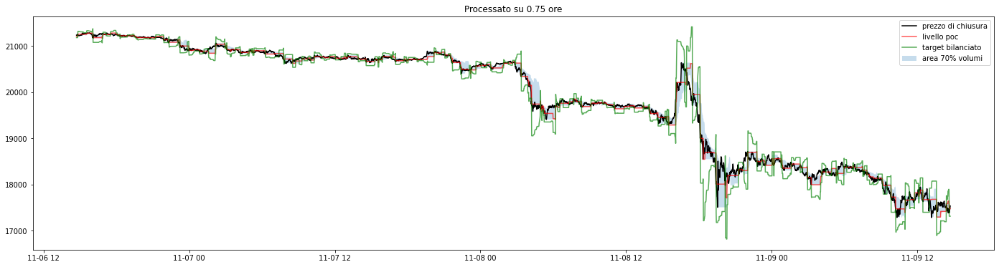

addestramento su: 0.75 ore, partendo da 2022-09-11 17:06:48  portafoglio: -164.88 -> -0.75% - vincite: 38 / 57 -> 66.66%


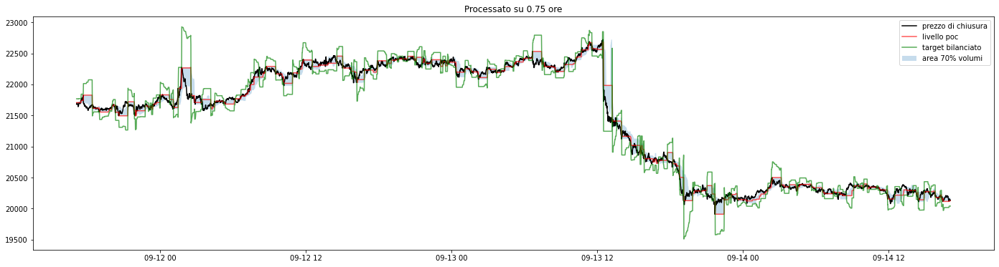

addestramento su: 0.75 ore, partendo da 2022-08-28 16:40:41  portafoglio: 111.56 -> 0.55% - vincite: 42 / 63 -> 66.66%


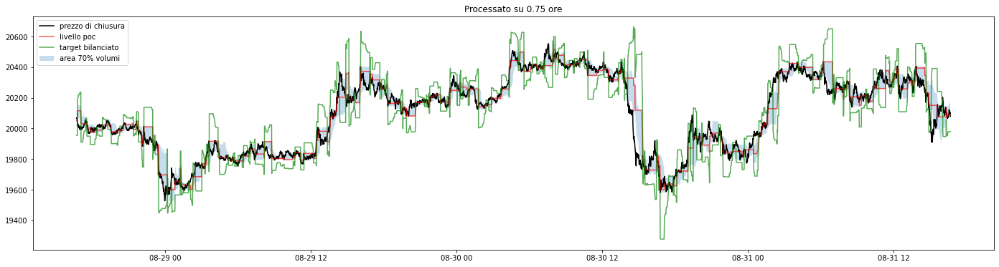

addestramento su: 0.75 ore, partendo da 2022-10-13 07:32:47  portafoglio: -271.25 -> -1.41% - vincite: 43 / 72 -> 59.72%


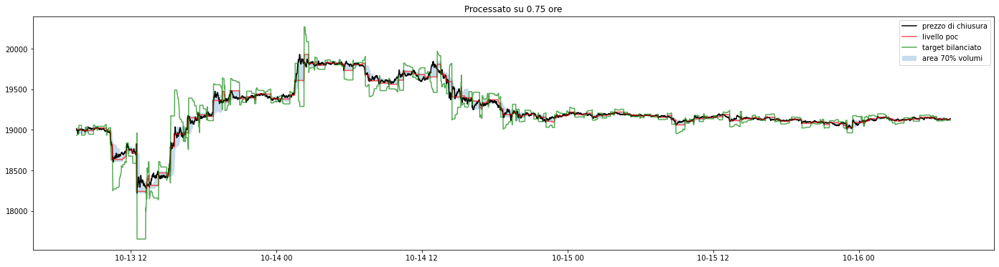

addestramento su: 0.75 ore, partendo da 2022-10-07 13:16:10  portafoglio: 308.29 -> 1.58% - vincite: 35 / 57 -> 61.4%


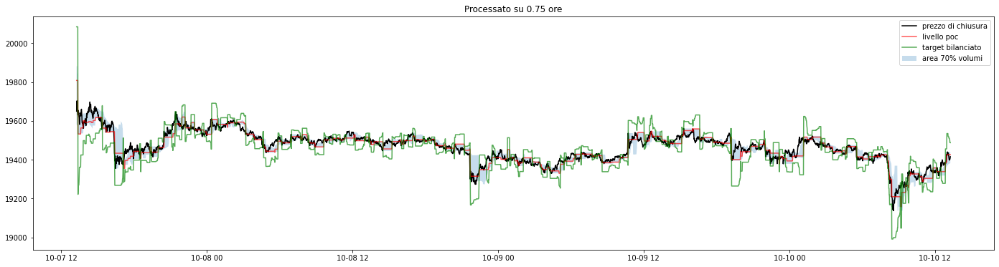

addestramento su: 0.75 ore, partendo da 2022-09-09 01:06:31  portafoglio: 61.77 -> 0.28% - vincite: 35 / 56 -> 62.5%


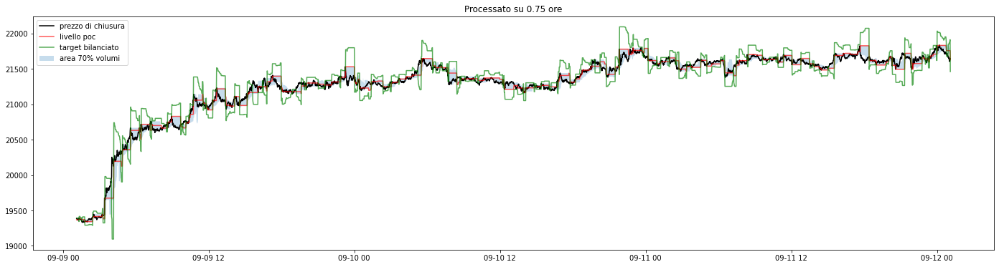

addestramento su: 0.75 ore, partendo da 2022-08-20 20:26:40  portafoglio: 441.84 -> 2.06% - vincite: 35 / 60 -> 58.33%


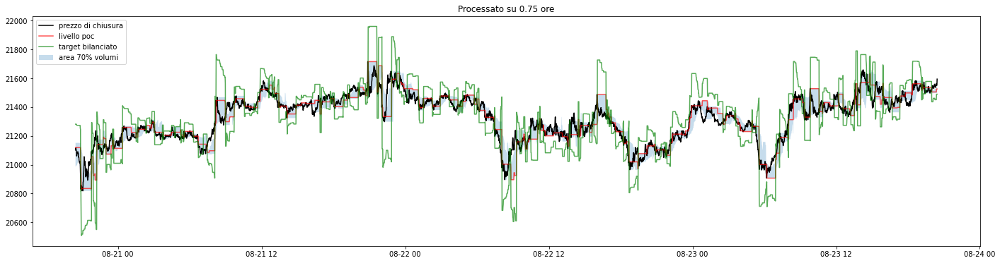

addestramento su: 0.75 ore, partendo da 2022-11-27 10:09:59  portafoglio: 225.82 -> 1.37% - vincite: 39 / 60 -> 65.0%


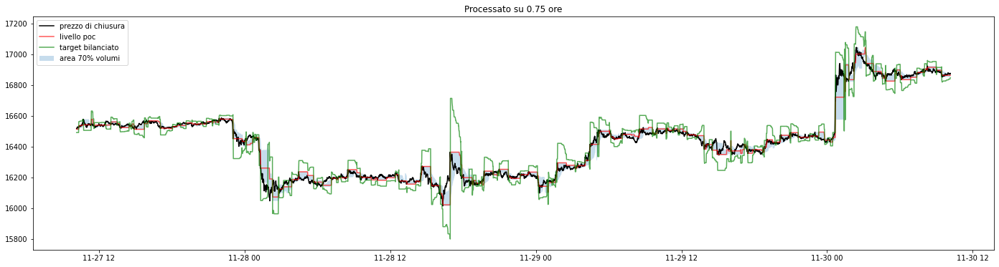

addestramento su: 0.75 ore, partendo da 2022-10-18 07:39:02  portafoglio: 208.8 -> 1.08% - vincite: 35 / 56 -> 62.5%


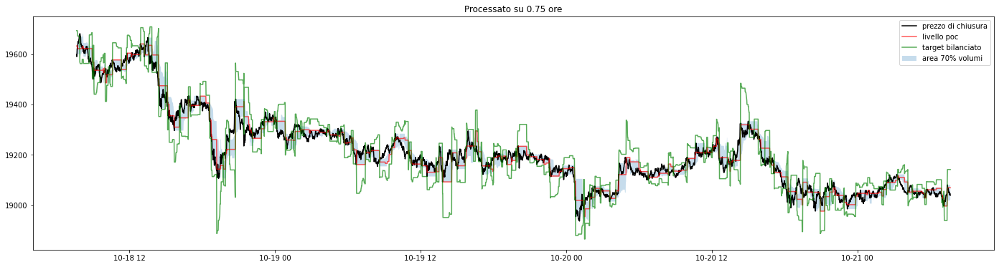

addestramento su: 0.75 ore, partendo da 2022-11-18 08:15:24  portafoglio: -266.46 -> -1.6% - vincite: 37 / 63 -> 58.73%


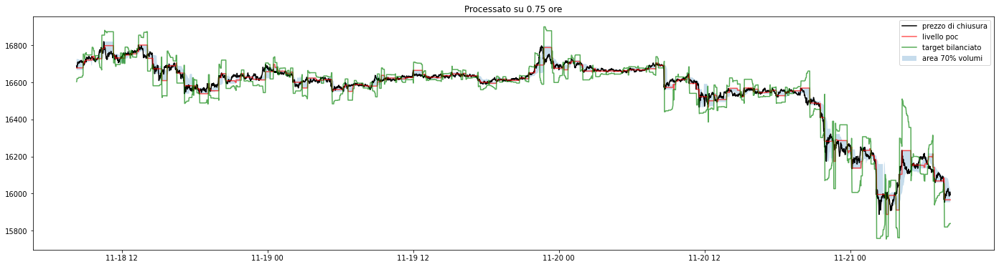

--------------------------------------------------
portafoglio: -5.56 -> -0.02%
vincite: 37.5 / 60.3 62.18%
--------------------------------------------------


--------------------------------------------------
                     6 / 17
--------------------------------------------------
addestramento su: 1 ore, partendo da 2022-11-06 14:42:08  portafoglio: -896.73 -> -4.37% - vincite: 31 / 46 -> 67.39%


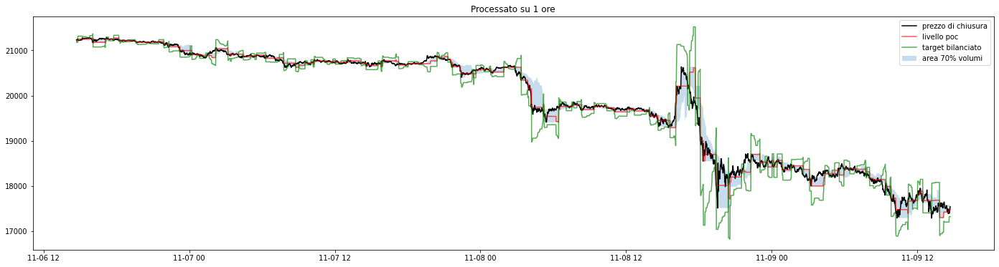

addestramento su: 1 ore, partendo da 2022-09-11 17:06:48  portafoglio: 326.0 -> 1.5% - vincite: 30 / 42 -> 71.42%


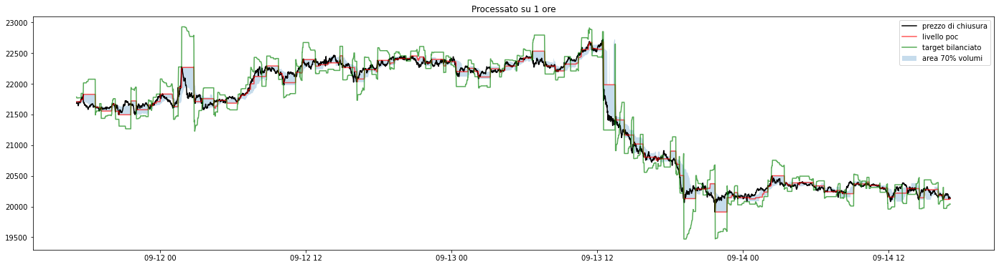

addestramento su: 1 ore, partendo da 2022-08-28 16:40:41  portafoglio: -239.27 -> -1.18% - vincite: 33 / 48 -> 68.75%


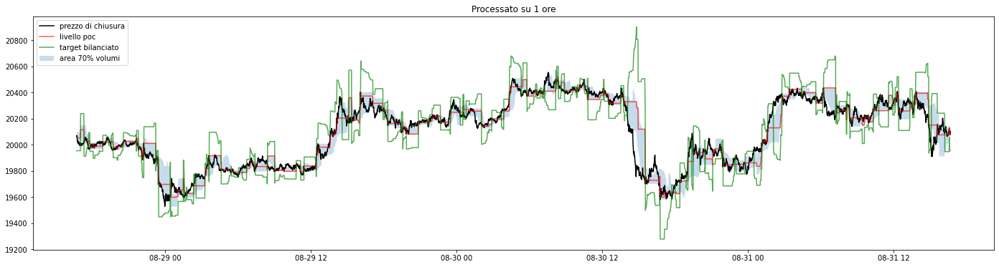

addestramento su: 1 ore, partendo da 2022-10-13 07:32:47  portafoglio: -417.45 -> -2.17% - vincite: 34 / 53 -> 64.15%


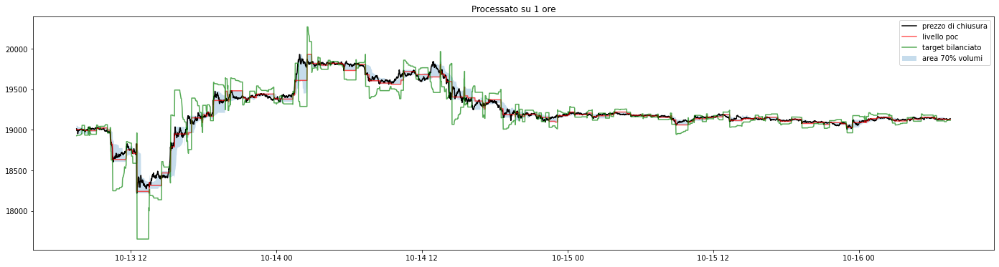

addestramento su: 1 ore, partendo da 2022-10-07 13:16:10  portafoglio: 89.38 -> 0.45% - vincite: 27 / 45 -> 60.0%


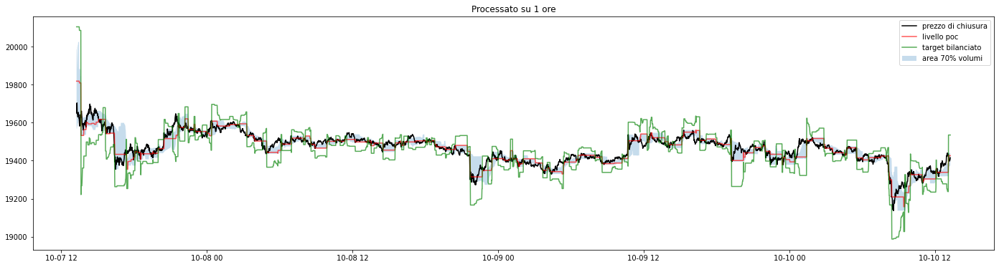

addestramento su: 1 ore, partendo da 2022-09-09 01:06:31  portafoglio: 103.17 -> 0.48% - vincite: 31 / 41 -> 75.6%


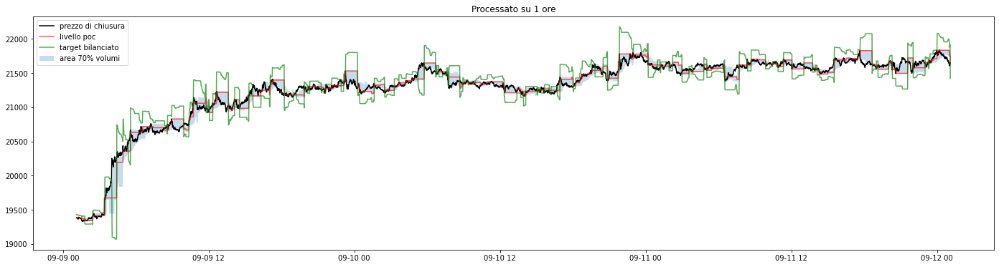

addestramento su: 1 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1043.76 -> 4.88% - vincite: 33 / 46 -> 71.73%


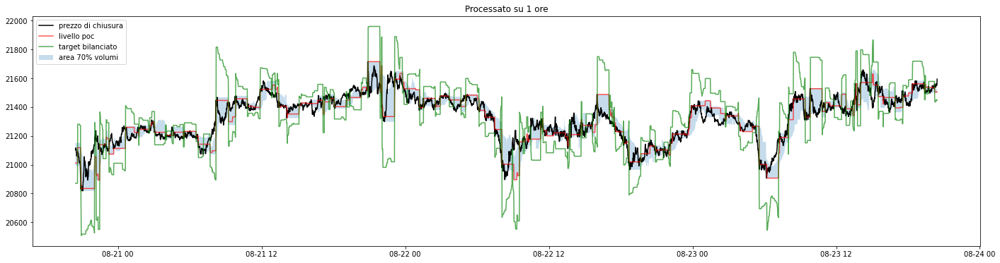

addestramento su: 1 ore, partendo da 2022-11-27 10:09:59  portafoglio: 140.93 -> 0.85% - vincite: 32 / 47 -> 68.08%


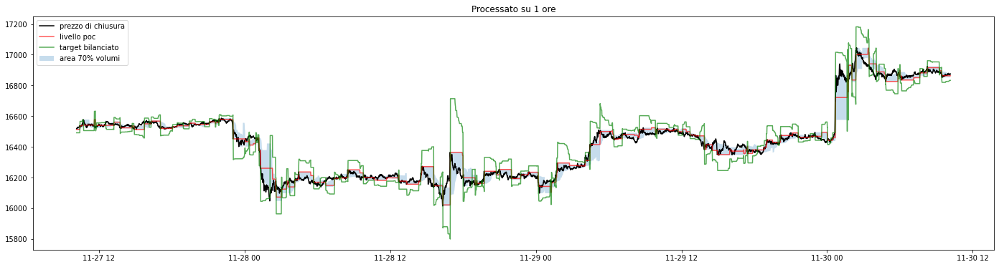

addestramento su: 1 ore, partendo da 2022-10-18 07:39:02  portafoglio: 76.78 -> 0.4% - vincite: 28 / 47 -> 59.57%


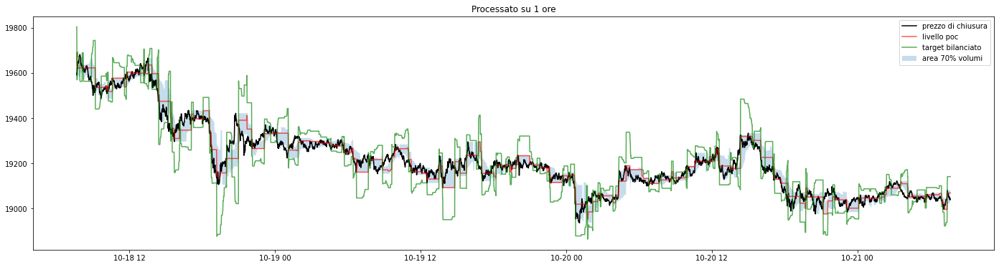

addestramento su: 1 ore, partendo da 2022-11-18 08:15:24  portafoglio: -367.43 -> -2.21% - vincite: 31 / 51 -> 60.78%


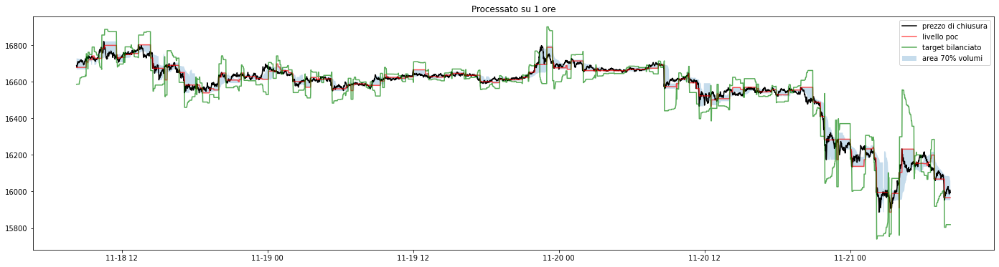

--------------------------------------------------
portafoglio: -14.08 -> -0.07%
vincite: 31.0 / 46.6 66.52%
--------------------------------------------------


--------------------------------------------------
                     7 / 17
--------------------------------------------------
addestramento su: 1.5 ore, partendo da 2022-11-06 14:42:08  portafoglio: 457.46 -> 2.23% - vincite: 21 / 33 -> 63.63%


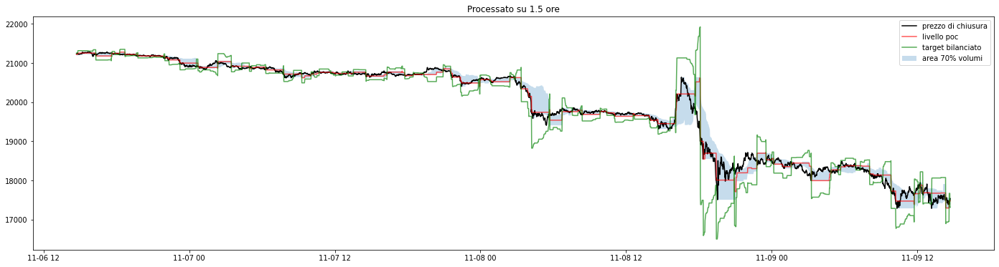

addestramento su: 1.5 ore, partendo da 2022-09-11 17:06:48  portafoglio: 1417.2 -> 6.53% - vincite: 21 / 32 -> 65.62%


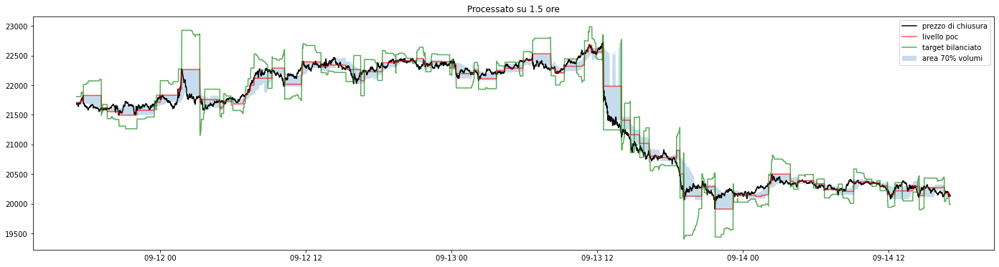

addestramento su: 1.5 ore, partendo da 2022-08-28 16:40:41  portafoglio: 109.3 -> 0.54% - vincite: 25 / 36 -> 69.44%


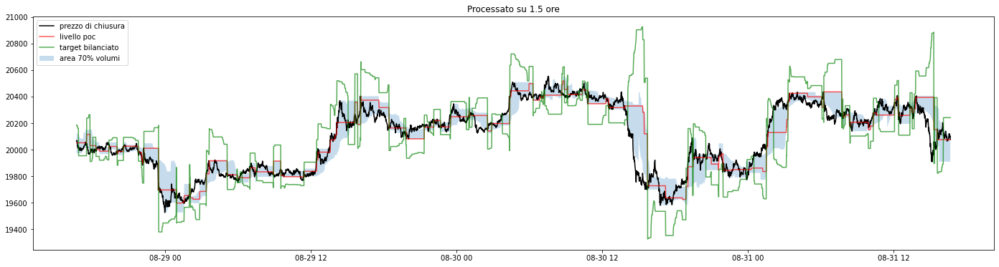

addestramento su: 1.5 ore, partendo da 2022-10-13 07:32:47  portafoglio: -711.81 -> -3.71% - vincite: 21 / 37 -> 56.75%


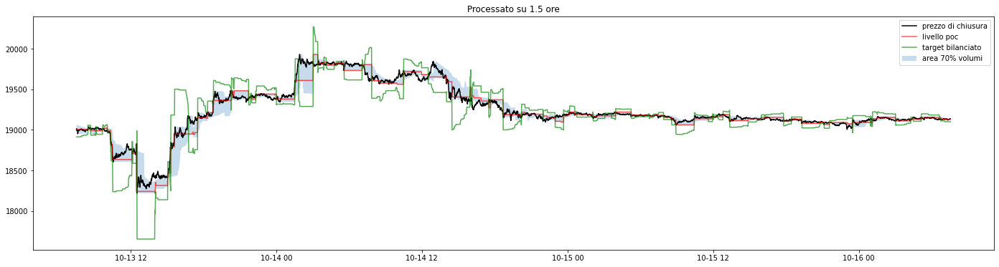

addestramento su: 1.5 ore, partendo da 2022-10-07 13:16:10  portafoglio: 385.44 -> 1.97% - vincite: 21 / 31 -> 67.74%


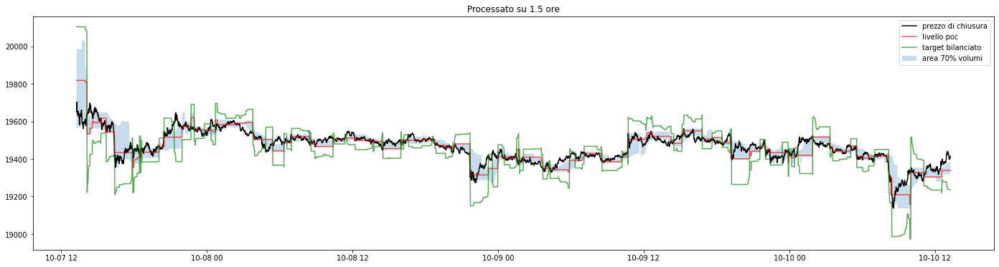

addestramento su: 1.5 ore, partendo da 2022-09-09 01:06:31  portafoglio: -705.22 -> -3.3% - vincite: 15 / 28 -> 53.57%


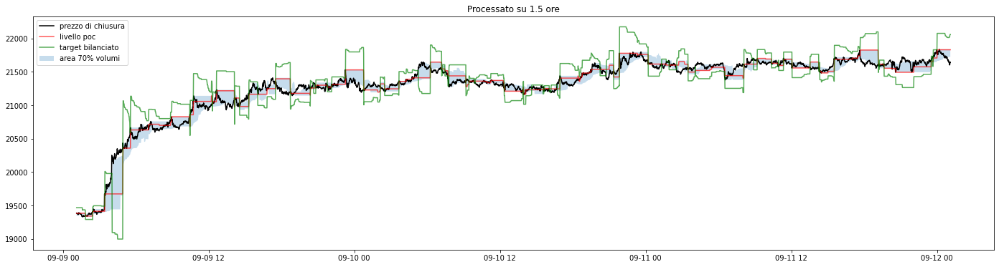

addestramento su: 1.5 ore, partendo da 2022-08-20 20:26:40  portafoglio: 800.04 -> 3.74% - vincite: 22 / 36 -> 61.11%


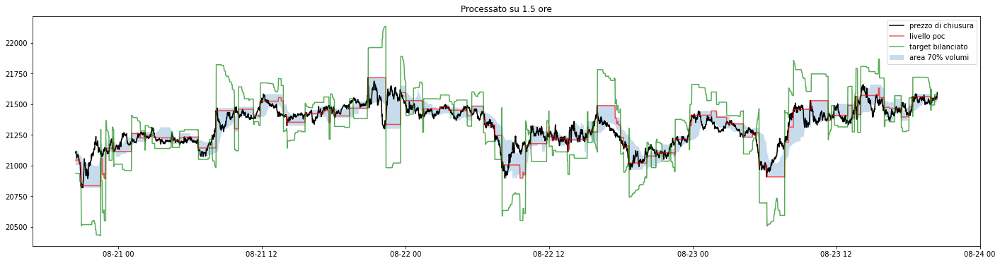

addestramento su: 1.5 ore, partendo da 2022-11-27 10:09:59  portafoglio: 142.82 -> 0.86% - vincite: 21 / 30 -> 70.0%


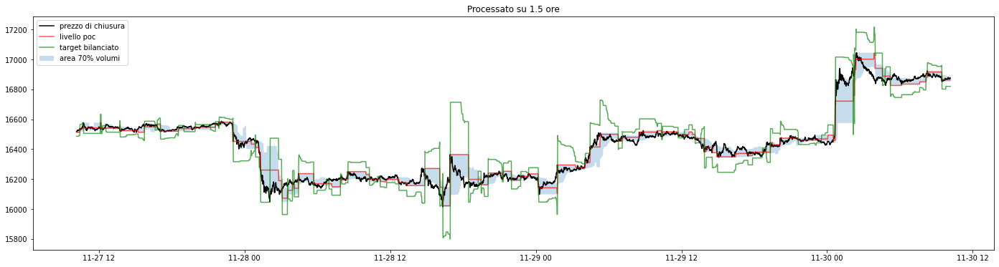

addestramento su: 1.5 ore, partendo da 2022-10-18 07:39:02  portafoglio: 19.92 -> 0.1% - vincite: 16 / 32 -> 50.0%


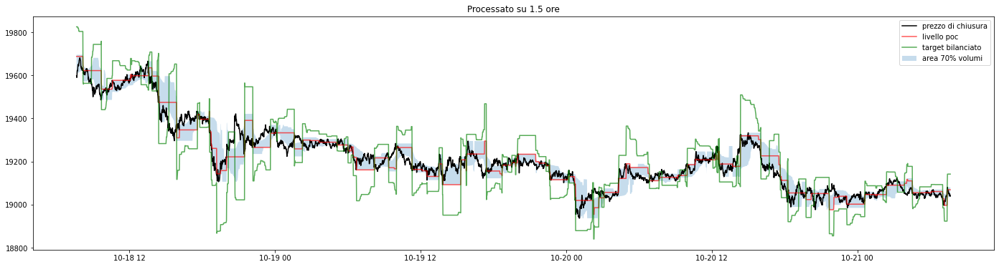

addestramento su: 1.5 ore, partendo da 2022-11-18 08:15:24  portafoglio: 279.61 -> 1.68% - vincite: 22 / 38 -> 57.89%


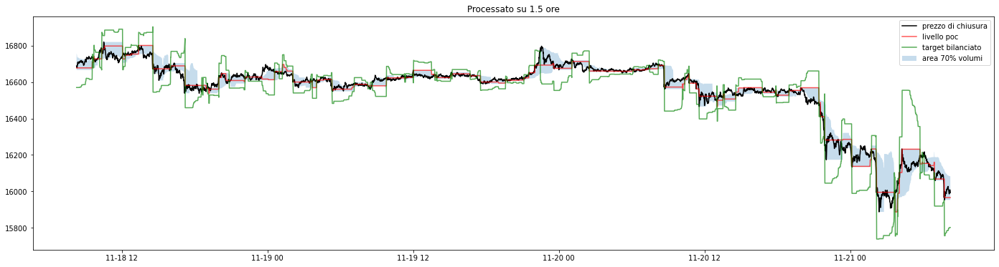

--------------------------------------------------
portafoglio: 219.47 -> 1.12%
vincite: 20.5 / 33.3 61.56%
--------------------------------------------------


--------------------------------------------------
                     8 / 17
--------------------------------------------------
addestramento su: 2 ore, partendo da 2022-11-06 14:42:08  portafoglio: 248.85 -> 1.21% - vincite: 13 / 25 -> 52.0%


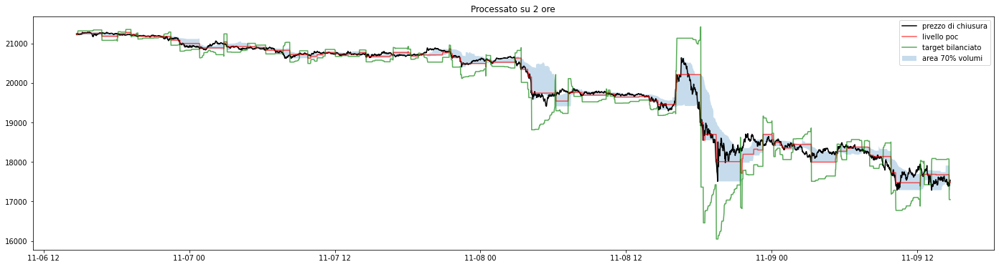

addestramento su: 2 ore, partendo da 2022-09-11 17:06:48  portafoglio: 1443.69 -> 6.65% - vincite: 18 / 23 -> 78.26%


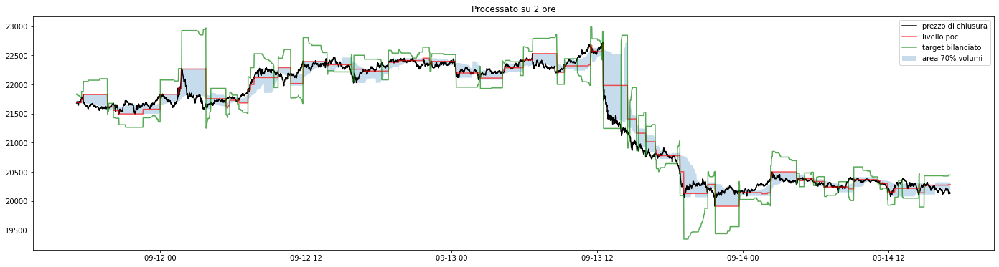

addestramento su: 2 ore, partendo da 2022-08-28 16:40:41  portafoglio: 385.73 -> 1.91% - vincite: 19 / 25 -> 76.0%


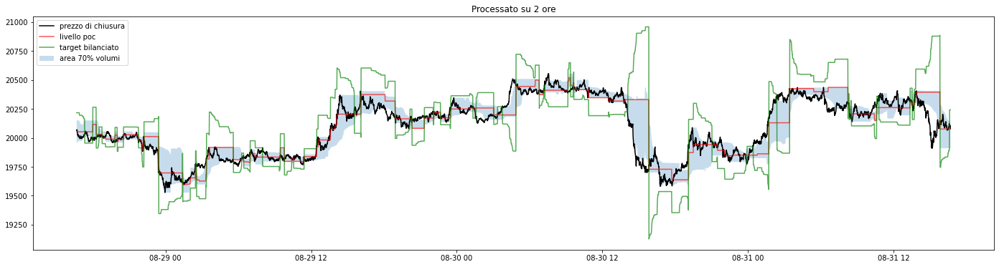

addestramento su: 2 ore, partendo da 2022-10-13 07:32:47  portafoglio: -318.37 -> -1.66% - vincite: 16 / 31 -> 51.61%


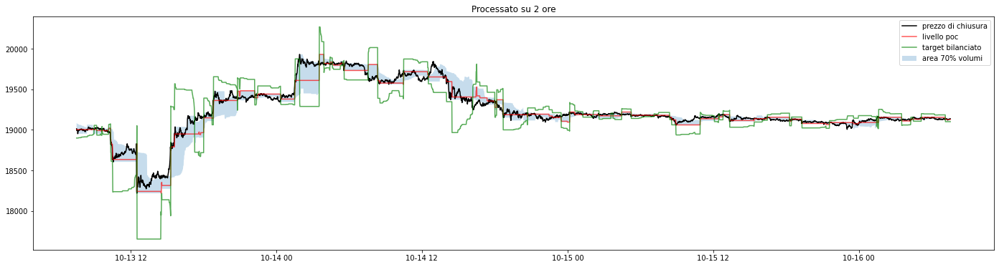

addestramento su: 2 ore, partendo da 2022-10-07 13:16:10  portafoglio: 138.3 -> 0.71% - vincite: 13 / 20 -> 65.0%


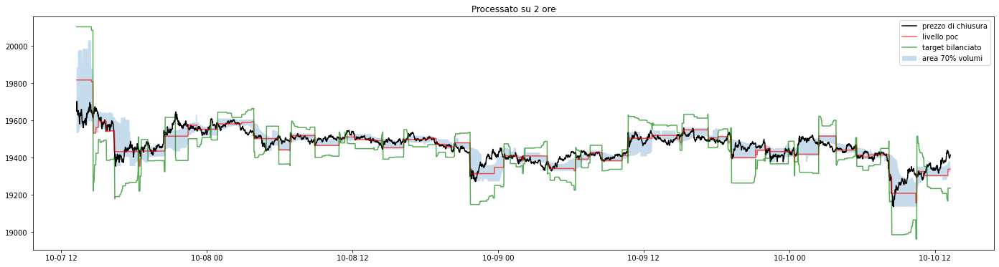

addestramento su: 2 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1011.97 -> -4.73% - vincite: 11 / 20 -> 55.0%


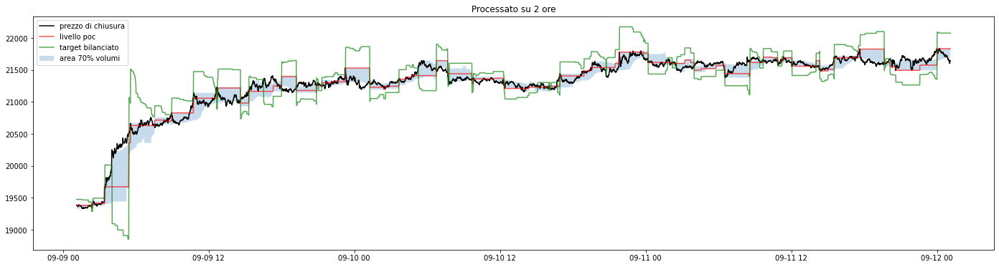

addestramento su: 2 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1876.43 -> 8.78% - vincite: 18 / 29 -> 62.06%


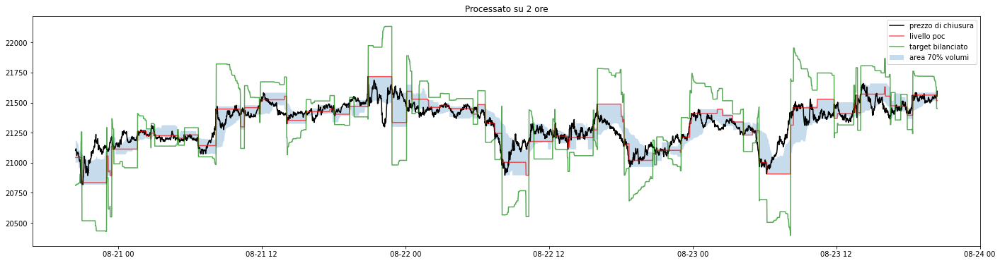

addestramento su: 2 ore, partendo da 2022-11-27 10:09:59  portafoglio: -188.51 -> -1.14% - vincite: 15 / 23 -> 65.21%


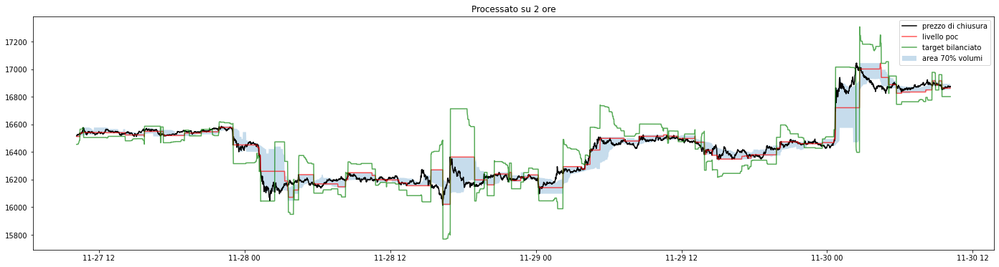

addestramento su: 2 ore, partendo da 2022-10-18 07:39:02  portafoglio: 382.4 -> 1.99% - vincite: 16 / 28 -> 57.14%


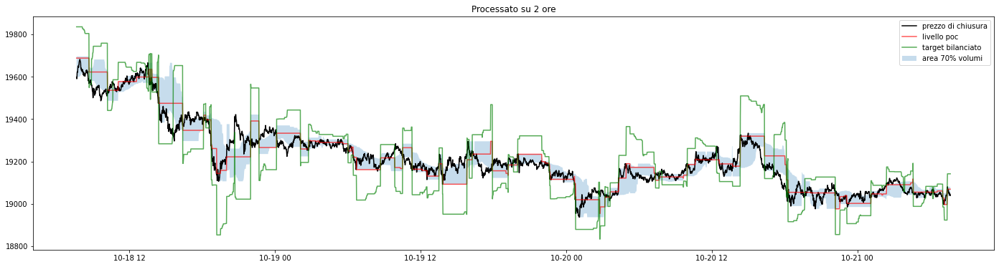

addestramento su: 2 ore, partendo da 2022-11-18 08:15:24  portafoglio: 428.48 -> 2.57% - vincite: 19 / 31 -> 61.29%


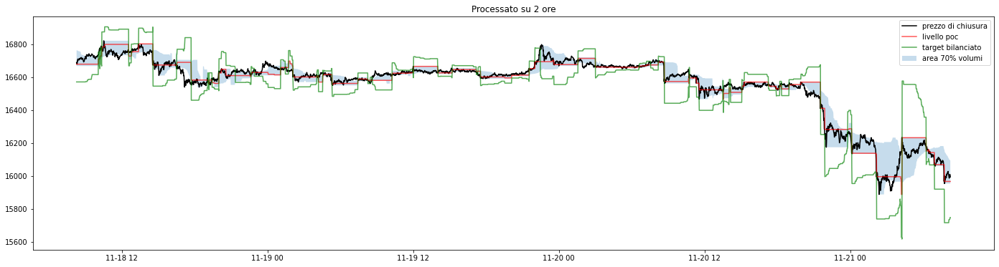

--------------------------------------------------
portafoglio: 338.5 -> 1.72%
vincite: 15.8 / 25.5 61.96%
--------------------------------------------------


--------------------------------------------------
                     9 / 17
--------------------------------------------------
addestramento su: 3 ore, partendo da 2022-11-06 14:42:08  portafoglio: 1522.17 -> 7.42% - vincite: 8 / 13 -> 61.53%


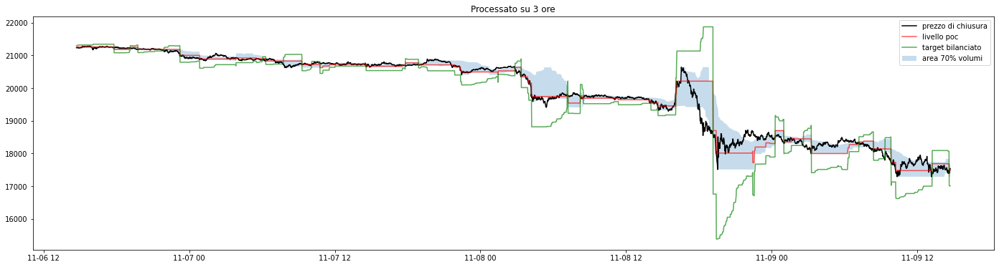

addestramento su: 3 ore, partendo da 2022-09-11 17:06:48  portafoglio: 449.92 -> 2.07% - vincite: 10 / 13 -> 76.92%


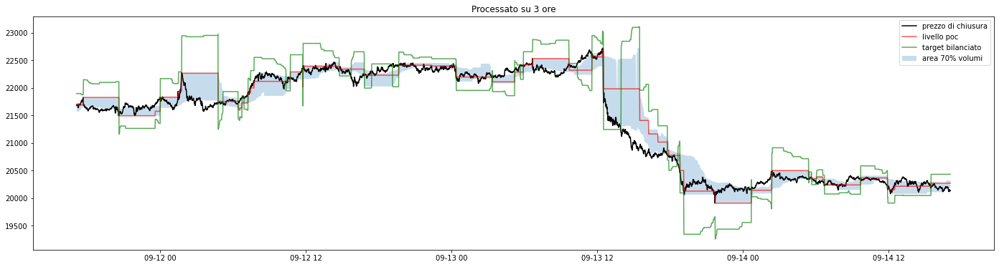

addestramento su: 3 ore, partendo da 2022-08-28 16:40:41  portafoglio: 505.03 -> 2.5% - vincite: 10 / 19 -> 52.63%


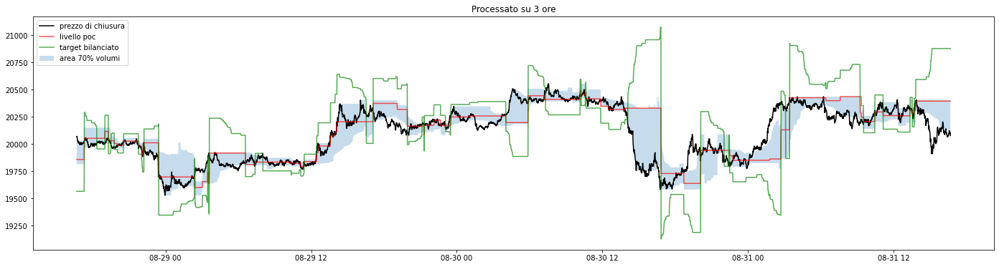

addestramento su: 3 ore, partendo da 2022-10-13 07:32:47  portafoglio: -578.77 -> -3.01% - vincite: 10 / 20 -> 50.0%


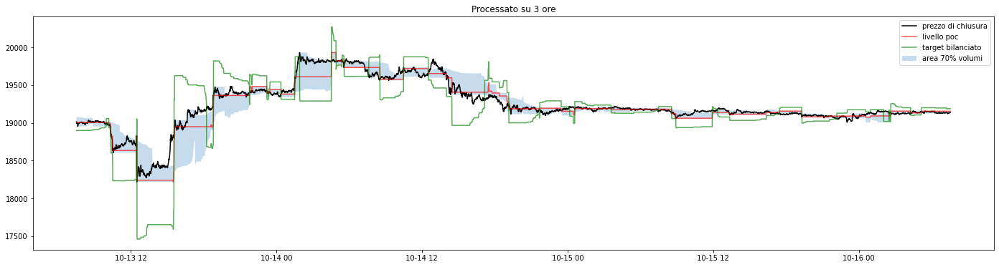

addestramento su: 3 ore, partendo da 2022-10-07 13:16:10  portafoglio: 167.97 -> 0.86% - vincite: 9 / 16 -> 56.25%


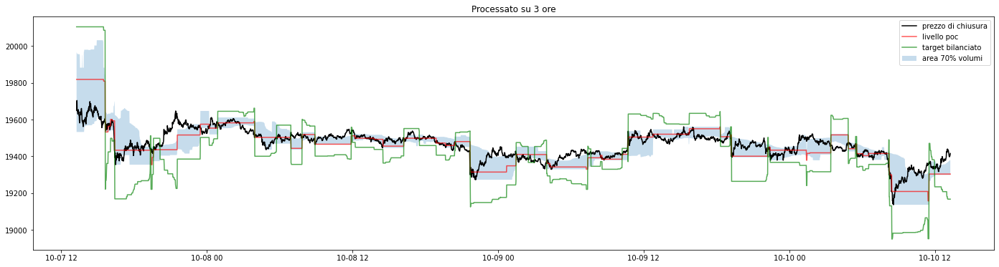

addestramento su: 3 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1046.12 -> -4.89% - vincite: 8 / 15 -> 53.33%


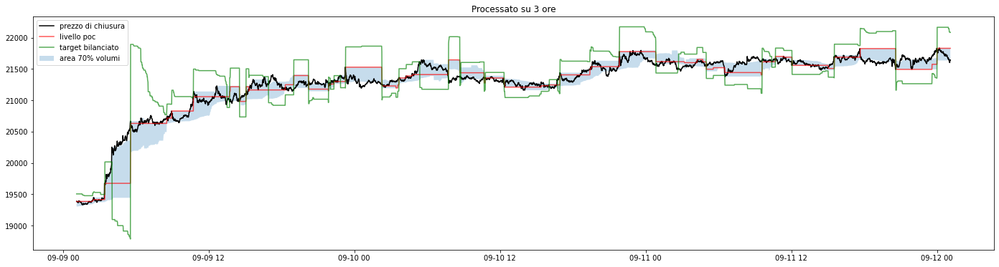

addestramento su: 3 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1858.86 -> 8.7% - vincite: 15 / 19 -> 78.94%


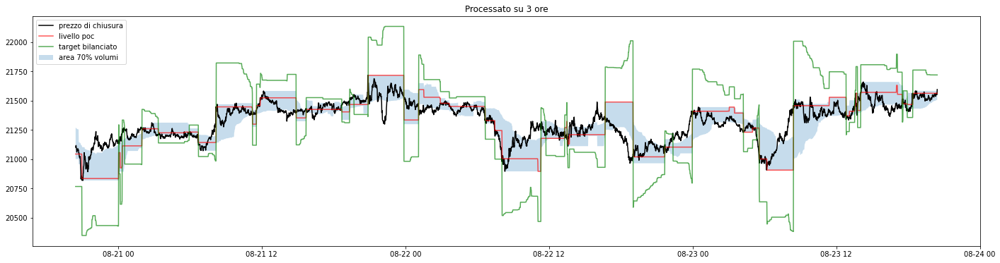

addestramento su: 3 ore, partendo da 2022-11-27 10:09:59  portafoglio: -306.02 -> -1.86% - vincite: 11 / 15 -> 73.33%


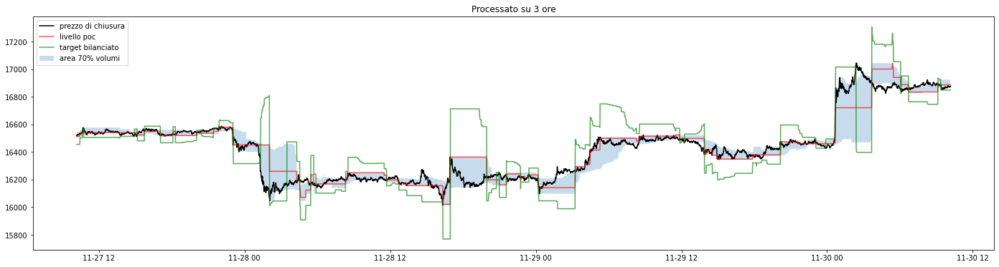

addestramento su: 3 ore, partendo da 2022-10-18 07:39:02  portafoglio: 599.3 -> 3.12% - vincite: 15 / 22 -> 68.18%


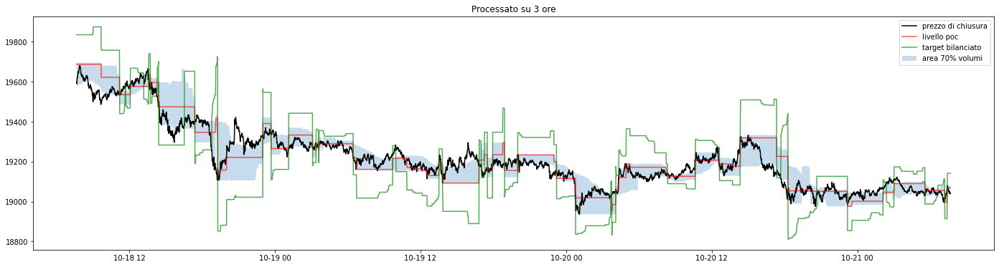

addestramento su: 3 ore, partendo da 2022-11-18 08:15:24  portafoglio: 308.91 -> 1.85% - vincite: 12 / 19 -> 63.15%


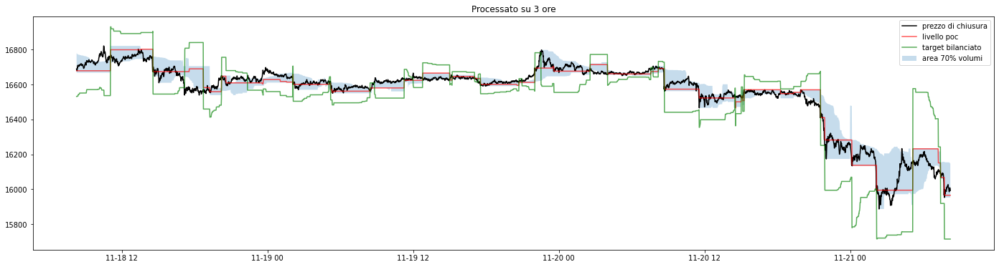

--------------------------------------------------
portafoglio: 348.12 -> 1.77%
vincite: 10.8 / 17.1 63.15%
--------------------------------------------------


--------------------------------------------------
                     10 / 17
--------------------------------------------------
addestramento su: 4 ore, partendo da 2022-11-06 14:42:08  portafoglio: 671.02 -> 3.27% - vincite: 5 / 11 -> 45.45%


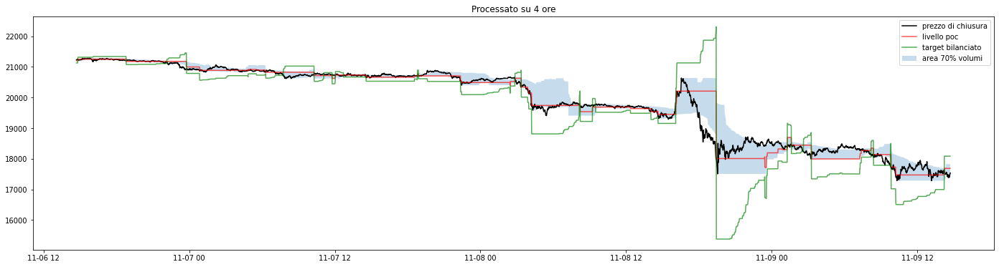

addestramento su: 4 ore, partendo da 2022-09-11 17:06:48  portafoglio: 1349.02 -> 6.21% - vincite: 10 / 15 -> 66.66%


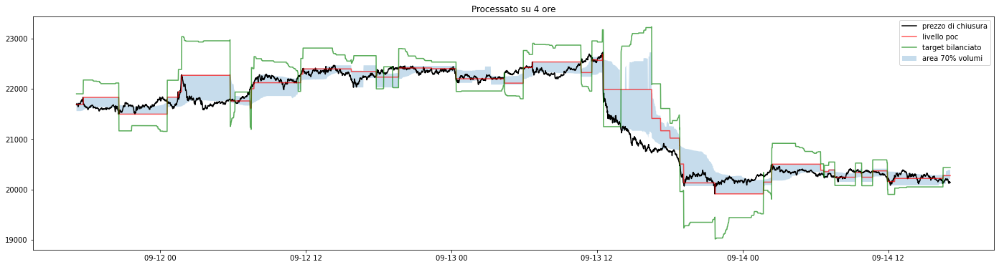

addestramento su: 4 ore, partendo da 2022-08-28 16:40:41  portafoglio: 247.95 -> 1.23% - vincite: 9 / 14 -> 64.28%


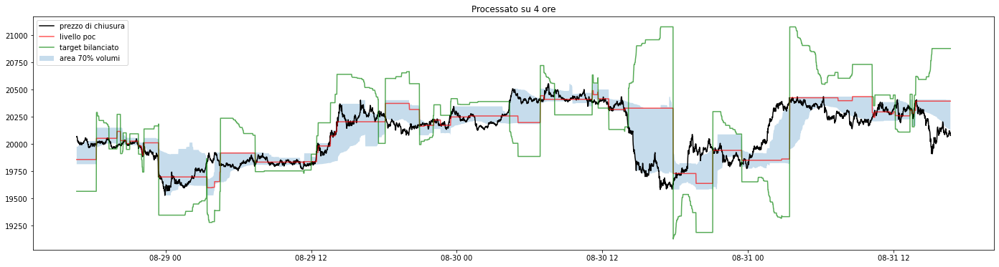

addestramento su: 4 ore, partendo da 2022-10-13 07:32:47  portafoglio: -174.4 -> -0.9% - vincite: 7 / 16 -> 43.75%


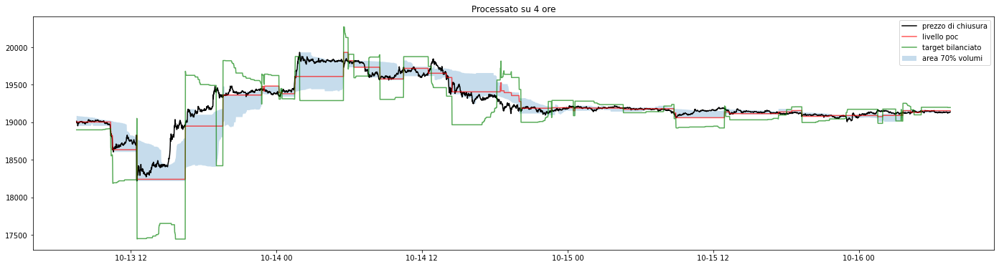

addestramento su: 4 ore, partendo da 2022-10-07 13:16:10  portafoglio: 108.02 -> 0.55% - vincite: 5 / 8 -> 62.5%


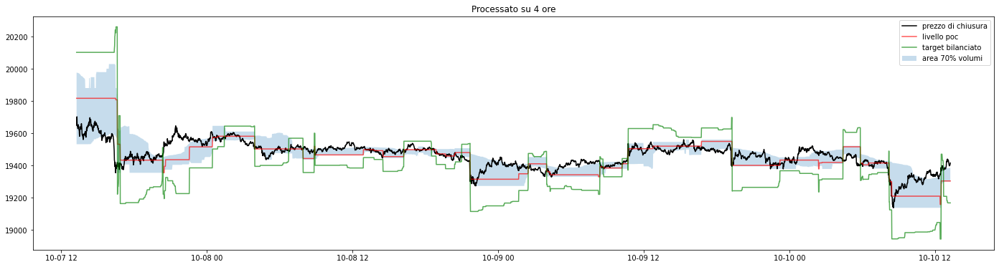

addestramento su: 4 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1248.33 -> -5.84% - vincite: 7 / 13 -> 53.84%


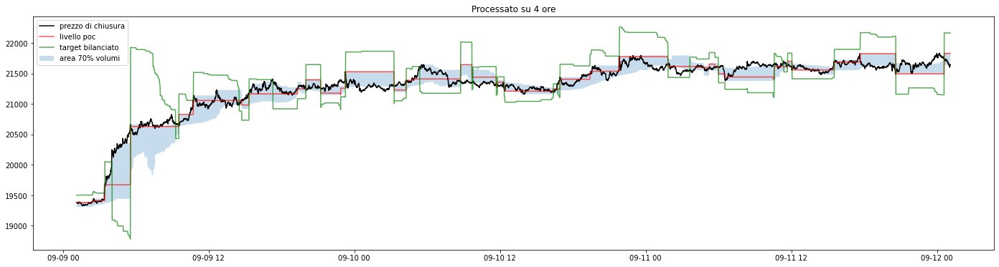

addestramento su: 4 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1407.28 -> 6.59% - vincite: 9 / 14 -> 64.28%


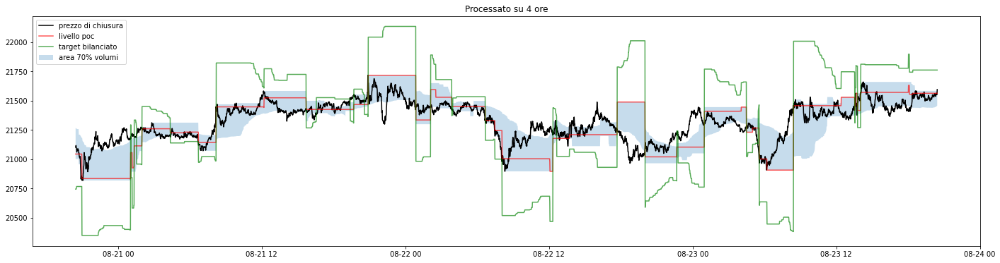

addestramento su: 4 ore, partendo da 2022-11-27 10:09:59  portafoglio: -13.83 -> -0.08% - vincite: 8 / 14 -> 57.14%


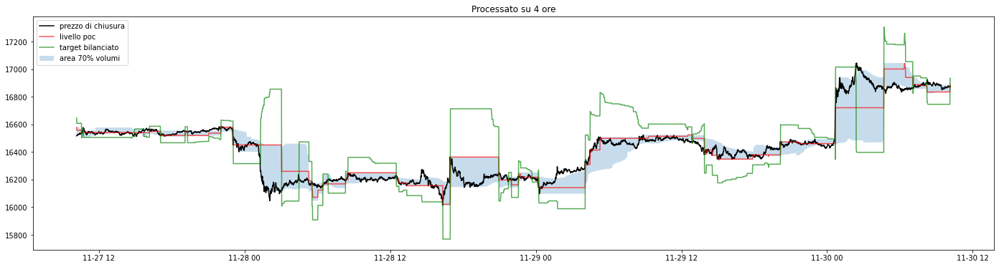

addestramento su: 4 ore, partendo da 2022-10-18 07:39:02  portafoglio: 592.73 -> 3.08% - vincite: 14 / 18 -> 77.77%


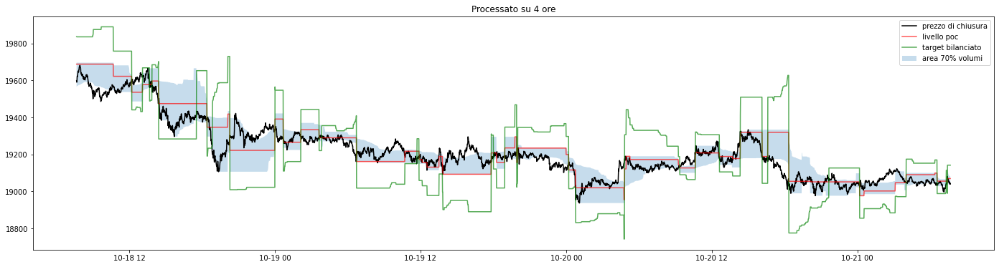

addestramento su: 4 ore, partendo da 2022-11-18 08:15:24  portafoglio: 62.79 -> 0.37% - vincite: 6 / 12 -> 50.0%


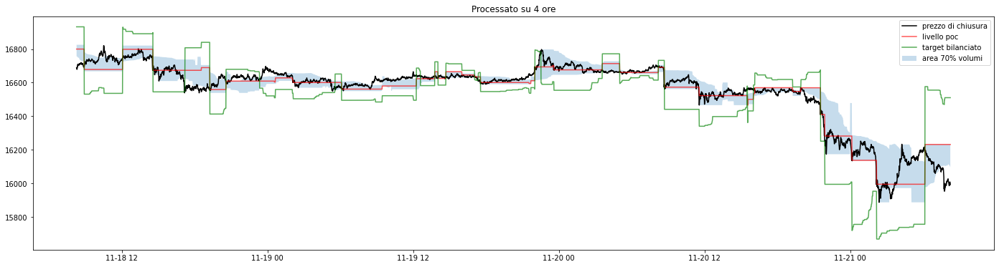

--------------------------------------------------
portafoglio: 300.22 -> 1.53%
vincite: 8.0 / 13.5 59.25%
--------------------------------------------------


--------------------------------------------------
                     11 / 17
--------------------------------------------------
addestramento su: 6 ore, partendo da 2022-11-06 14:42:08  portafoglio: 577.95 -> 2.82% - vincite: 3 / 6 -> 50.0%


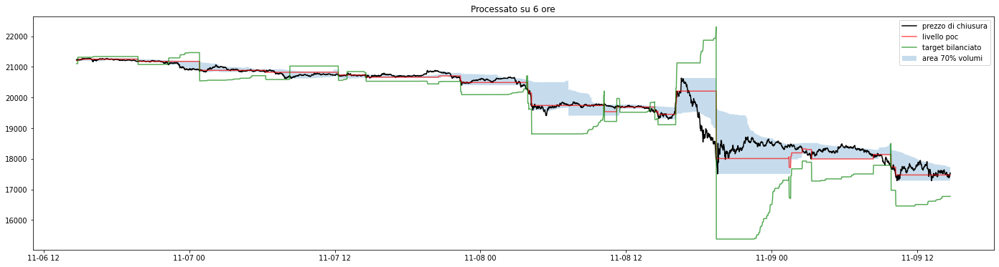

addestramento su: 6 ore, partendo da 2022-09-11 17:06:48  portafoglio: 606.34 -> 2.79% - vincite: 4 / 8 -> 50.0%


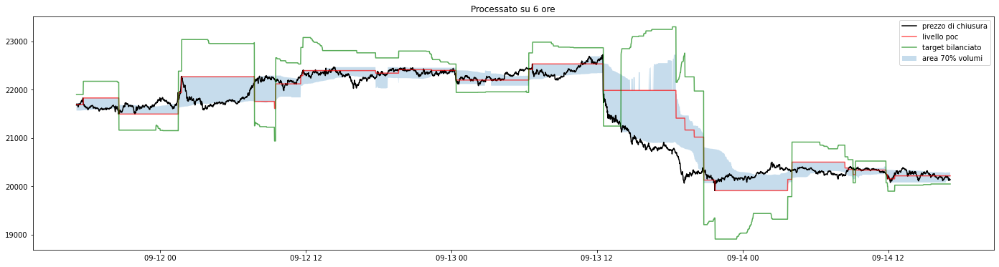

addestramento su: 6 ore, partendo da 2022-08-28 16:40:41  portafoglio: -62.55 -> -0.31% - vincite: 6 / 10 -> 60.0%


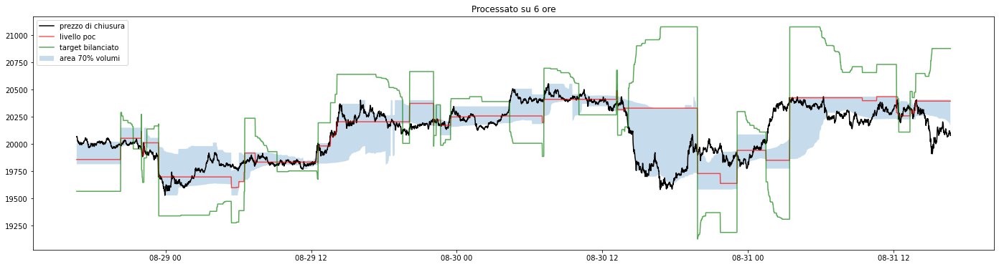

addestramento su: 6 ore, partendo da 2022-10-13 07:32:47  portafoglio: -307.75 -> -1.6% - vincite: 5 / 8 -> 62.5%


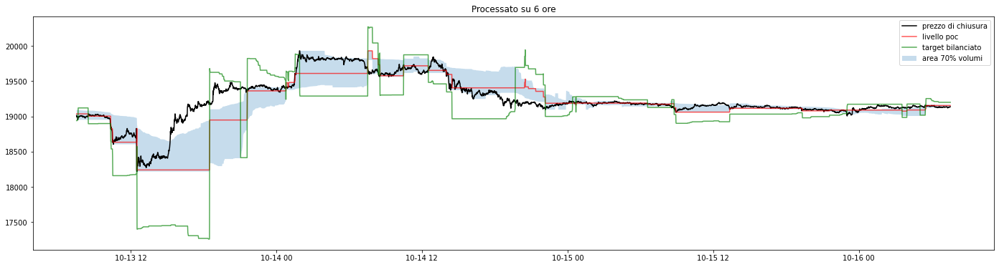

addestramento su: 6 ore, partendo da 2022-10-07 13:16:10  portafoglio: 205.38 -> 1.05% - vincite: 5 / 7 -> 71.42%


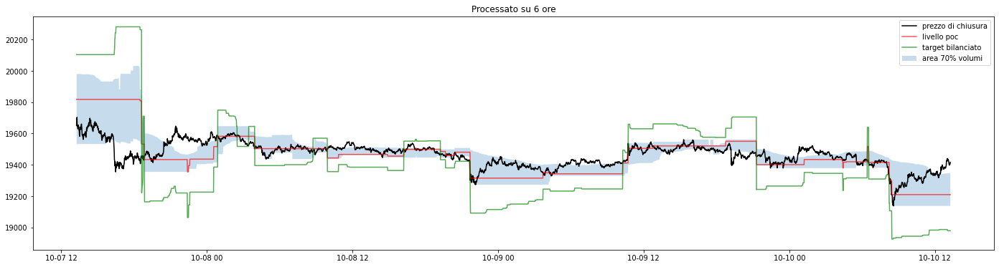

addestramento su: 6 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1339.74 -> -6.27% - vincite: 4 / 6 -> 66.66%


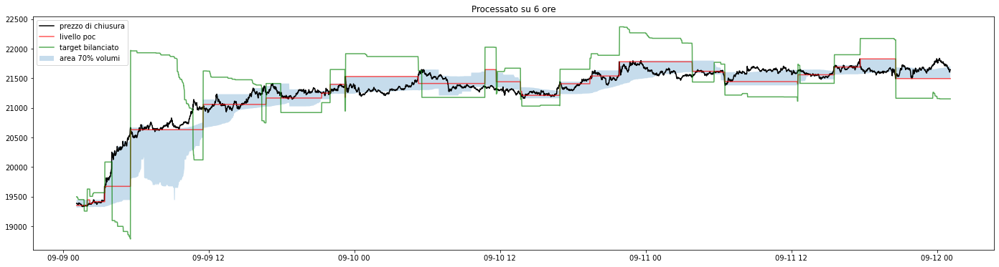

addestramento su: 6 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1738.36 -> 8.14% - vincite: 7 / 10 -> 70.0%


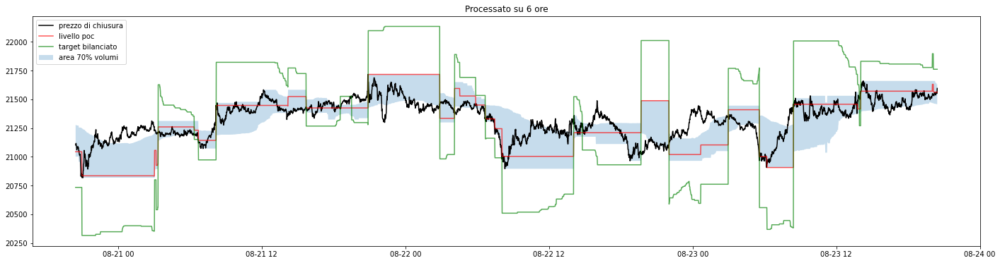

addestramento su: 6 ore, partendo da 2022-11-27 10:09:59  portafoglio: 29.11 -> 0.17% - vincite: 6 / 10 -> 60.0%


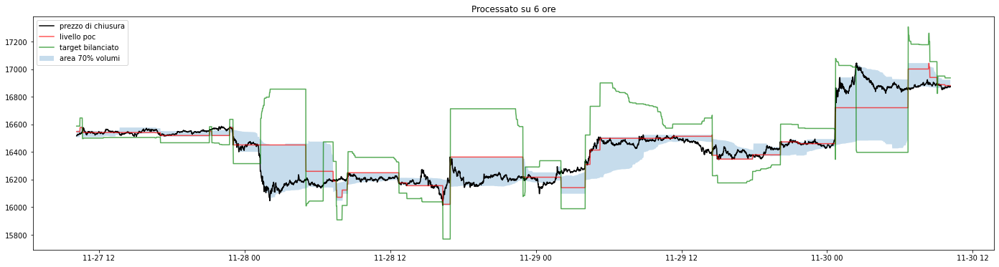

addestramento su: 6 ore, partendo da 2022-10-18 07:39:02  portafoglio: -22.07 -> -0.11% - vincite: 4 / 8 -> 50.0%


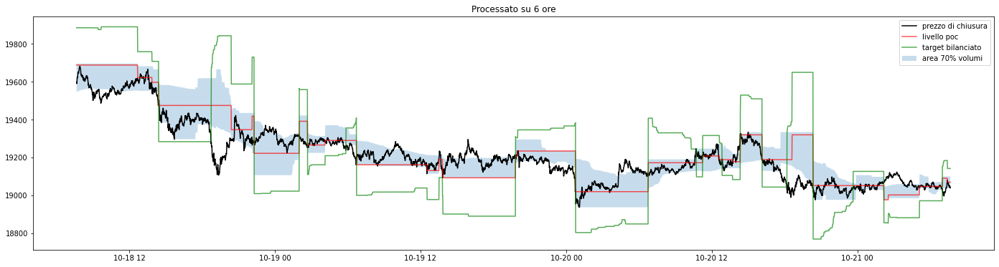

addestramento su: 6 ore, partendo da 2022-11-18 08:15:24  portafoglio: -131.75 -> -0.79% - vincite: 4 / 10 -> 40.0%


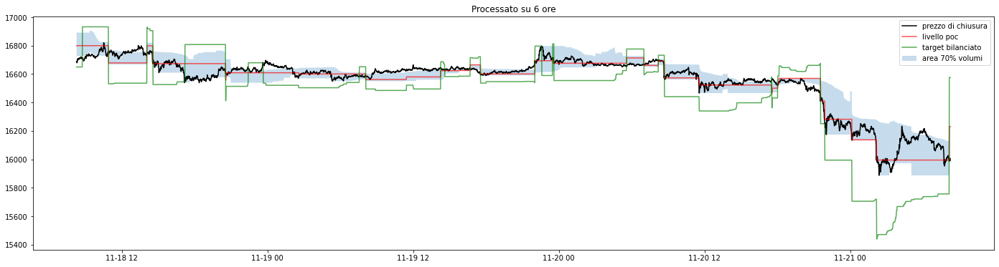

--------------------------------------------------
portafoglio: 129.32 -> 0.65%
vincite: 4.8 / 8.3 57.83%
--------------------------------------------------


--------------------------------------------------
                     12 / 17
--------------------------------------------------
addestramento su: 8 ore, partendo da 2022-11-06 14:42:08  portafoglio: 786.43 -> 3.83% - vincite: 3 / 6 -> 50.0%


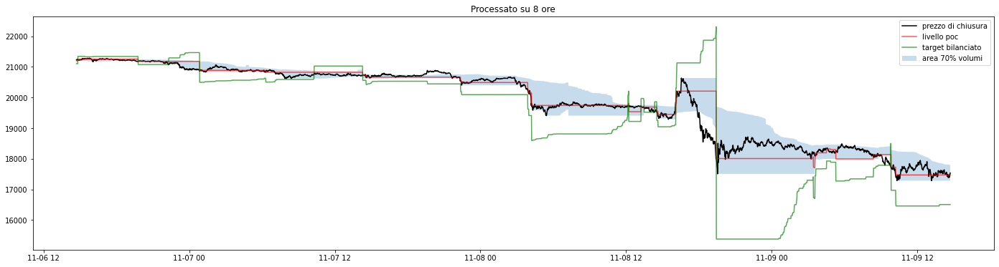

addestramento su: 8 ore, partendo da 2022-09-11 17:06:48  portafoglio: 874.17 -> 4.02% - vincite: 5 / 7 -> 71.42%


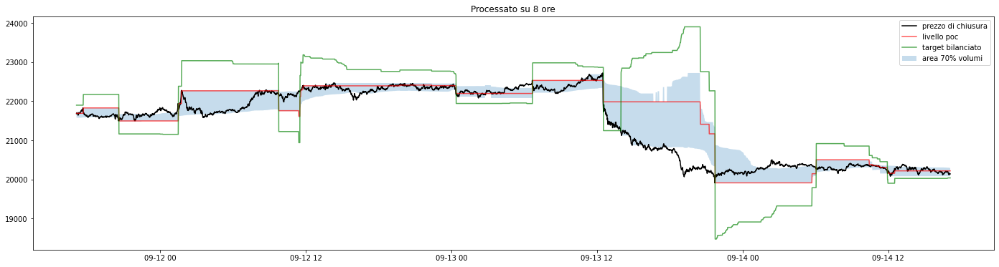

addestramento su: 8 ore, partendo da 2022-08-28 16:40:41  portafoglio: 296.45 -> 1.47% - vincite: 5 / 6 -> 83.33%


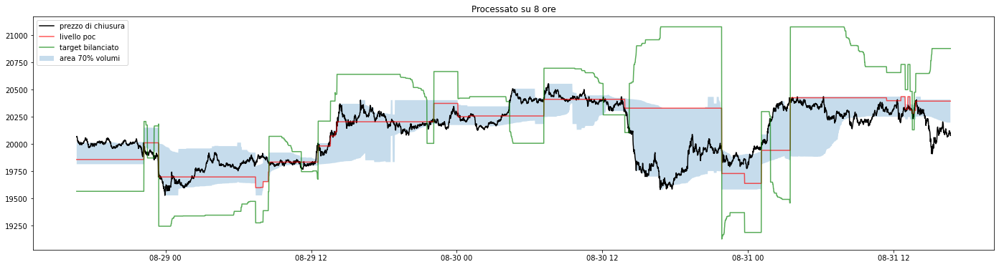

addestramento su: 8 ore, partendo da 2022-10-13 07:32:47  portafoglio: -35.44 -> -0.18% - vincite: 4 / 8 -> 50.0%


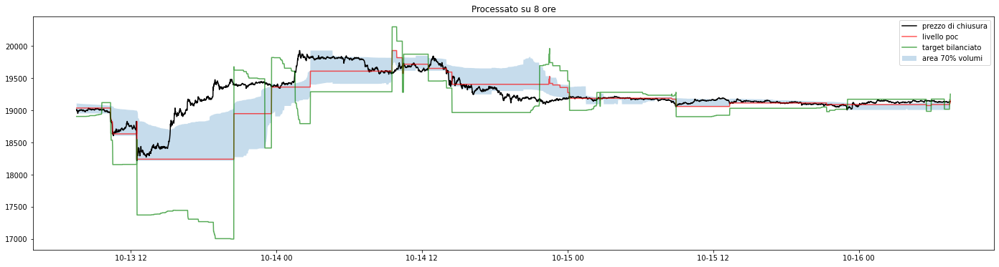

addestramento su: 8 ore, partendo da 2022-10-07 13:16:10  portafoglio: 459.44 -> 2.35% - vincite: 5 / 6 -> 83.33%


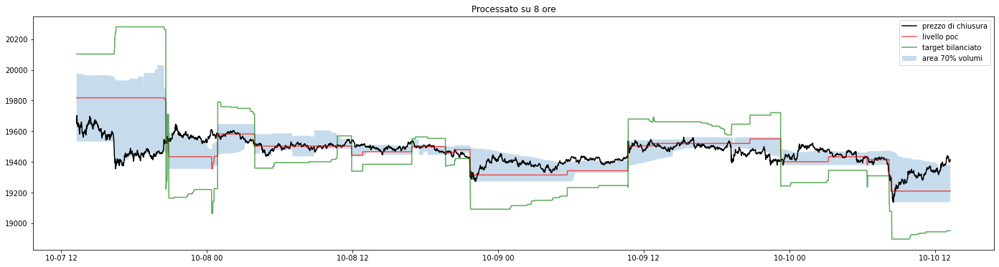

addestramento su: 8 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1695.86 -> -7.93% - vincite: 4 / 6 -> 66.66%


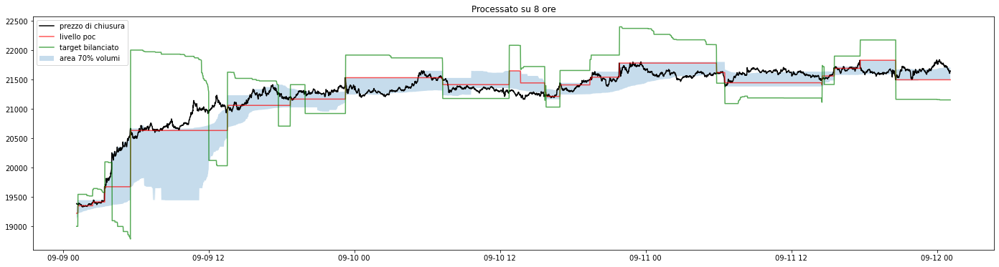

addestramento su: 8 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1408.05 -> 6.59% - vincite: 6 / 9 -> 66.66%


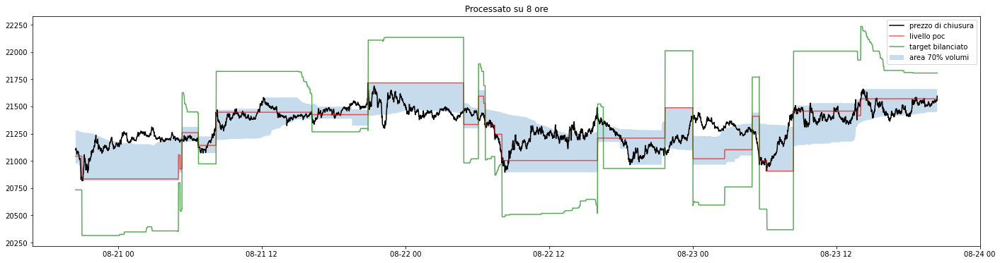

addestramento su: 8 ore, partendo da 2022-11-27 10:09:59  portafoglio: -307.2 -> -1.86% - vincite: 4 / 6 -> 66.66%


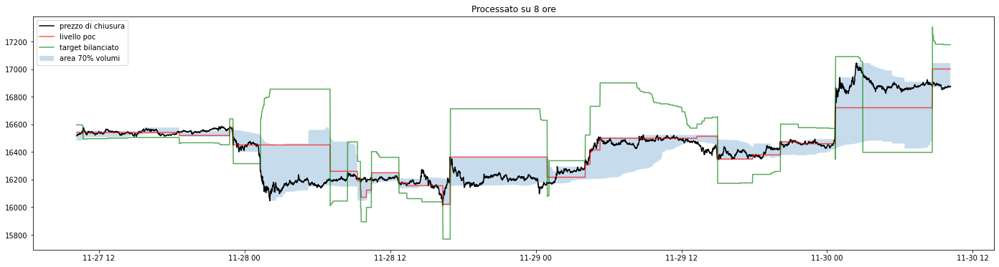

addestramento su: 8 ore, partendo da 2022-10-18 07:39:02  portafoglio: 33.8 -> 0.17% - vincite: 3 / 8 -> 37.5%


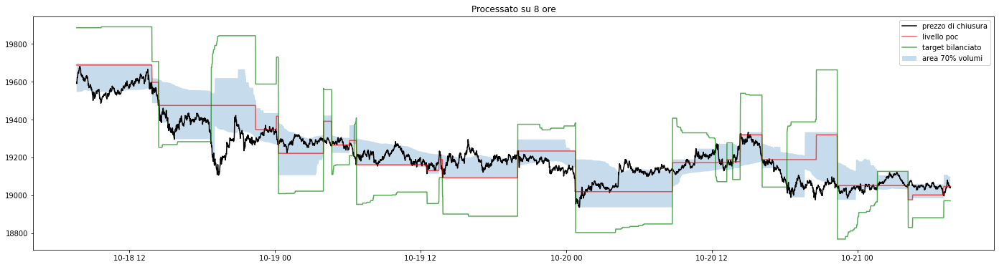

addestramento su: 8 ore, partendo da 2022-11-18 08:15:24  portafoglio: -255.47 -> -1.53% - vincite: 4 / 7 -> 57.14%


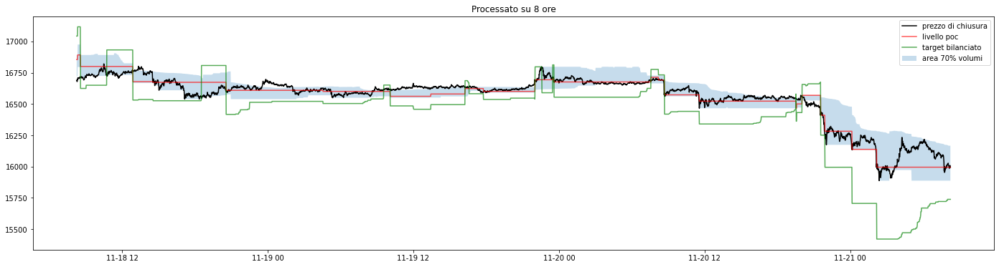

--------------------------------------------------
portafoglio: 156.43 -> 0.79%
vincite: 4.3 / 6.9 62.31%
--------------------------------------------------


--------------------------------------------------
                     13 / 17
--------------------------------------------------
addestramento su: 10 ore, partendo da 2022-11-06 14:42:08  portafoglio: 265.46 -> 1.29% - vincite: 3 / 5 -> 60.0%


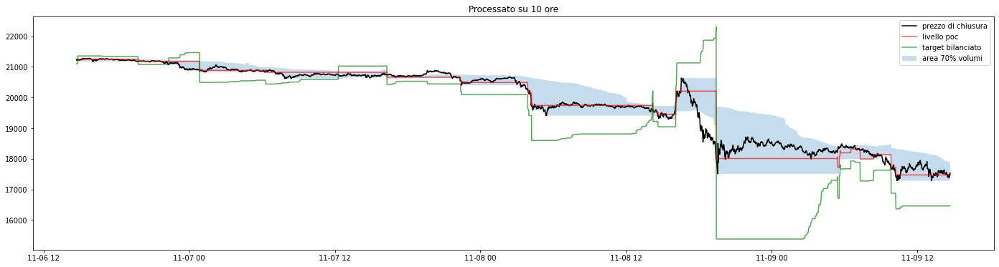

addestramento su: 10 ore, partendo da 2022-09-11 17:06:48  portafoglio: 483.45 -> 2.22% - vincite: 3 / 5 -> 60.0%


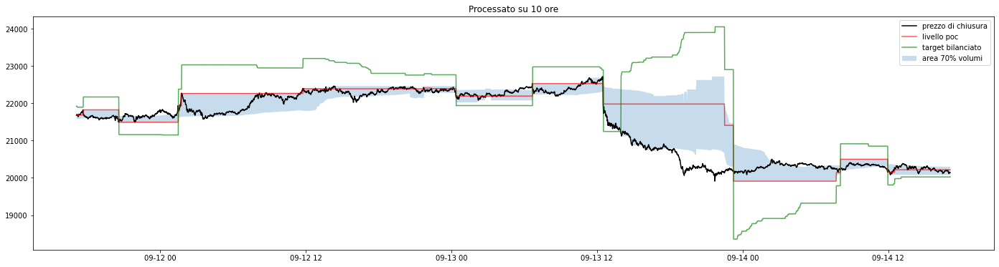

addestramento su: 10 ore, partendo da 2022-08-28 16:40:41  portafoglio: 736.33 -> 3.65% - vincite: 4 / 6 -> 66.66%


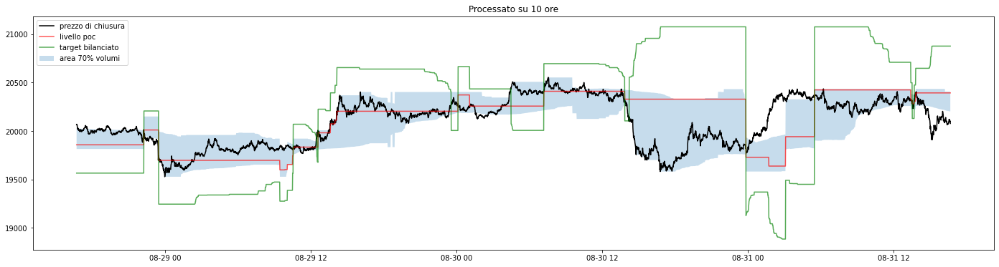

addestramento su: 10 ore, partendo da 2022-10-13 07:32:47  portafoglio: 231.72 -> 1.2% - vincite: 2 / 6 -> 33.33%


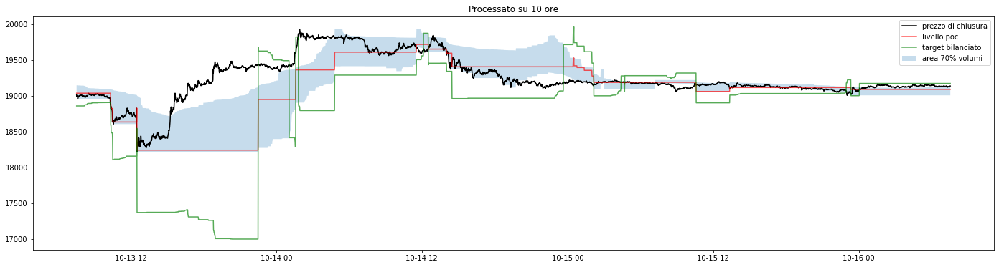

addestramento su: 10 ore, partendo da 2022-10-07 13:16:10  portafoglio: 306.92 -> 1.57% - vincite: 4 / 5 -> 80.0%


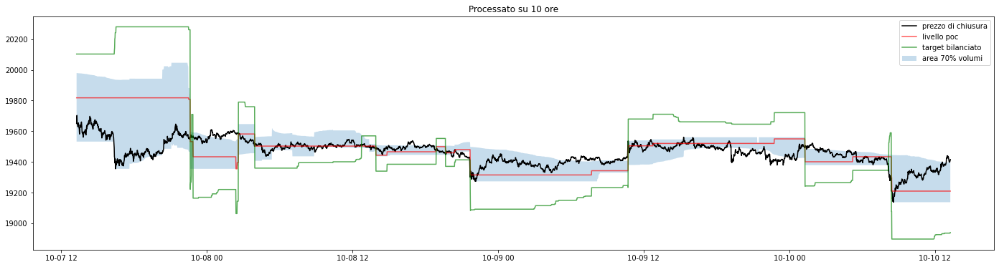

addestramento su: 10 ore, partendo da 2022-09-09 01:06:31  portafoglio: -2151.28 -> -10.06% - vincite: 1 / 3 -> 33.33%


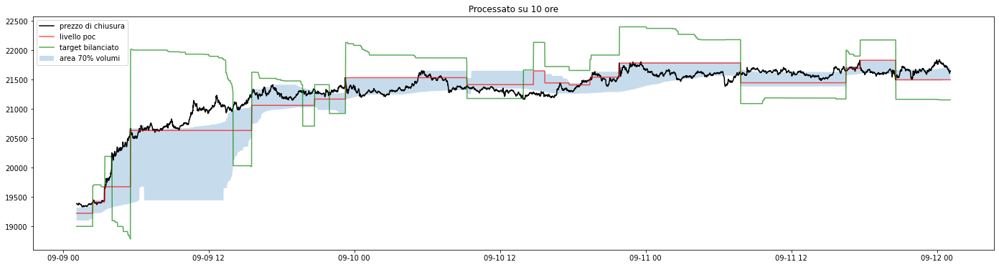

addestramento su: 10 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1059.92 -> 4.96% - vincite: 4 / 7 -> 57.14%


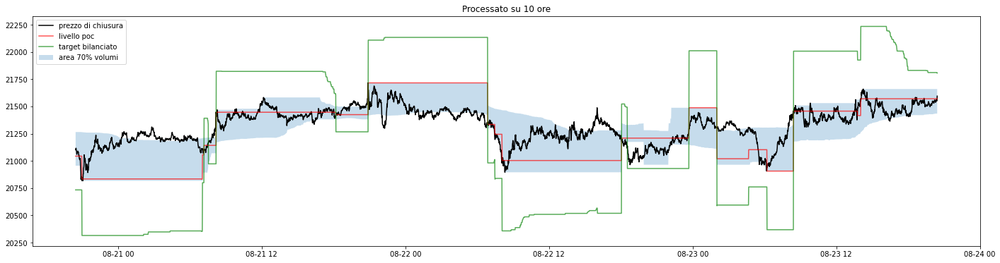

addestramento su: 10 ore, partendo da 2022-11-27 10:09:59  portafoglio: -192.39 -> -1.16% - vincite: 4 / 6 -> 66.66%


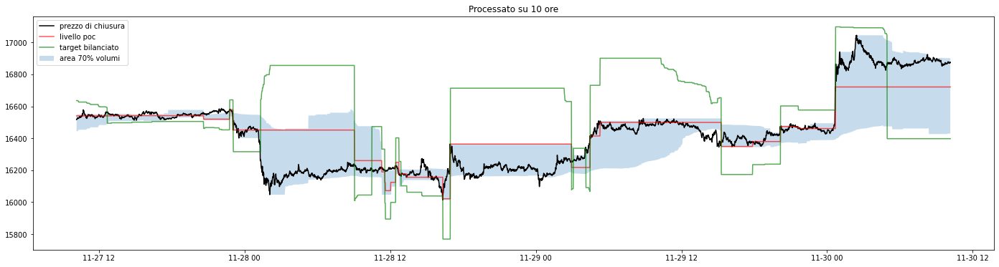

addestramento su: 10 ore, partendo da 2022-10-18 07:39:02  portafoglio: 64.77 -> 0.33% - vincite: 3 / 7 -> 42.85%


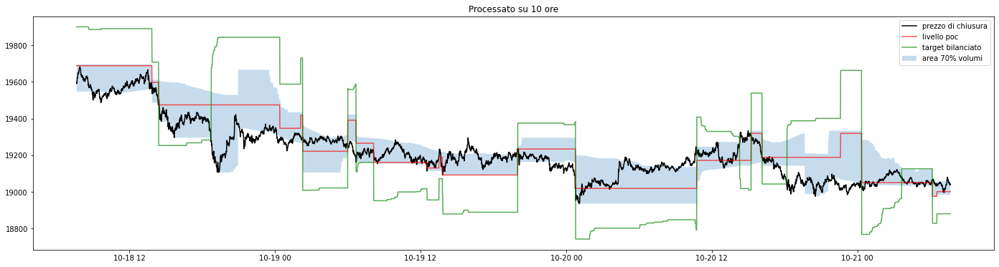

addestramento su: 10 ore, partendo da 2022-11-18 08:15:24  portafoglio: -577.99 -> -3.47% - vincite: 2 / 5 -> 40.0%


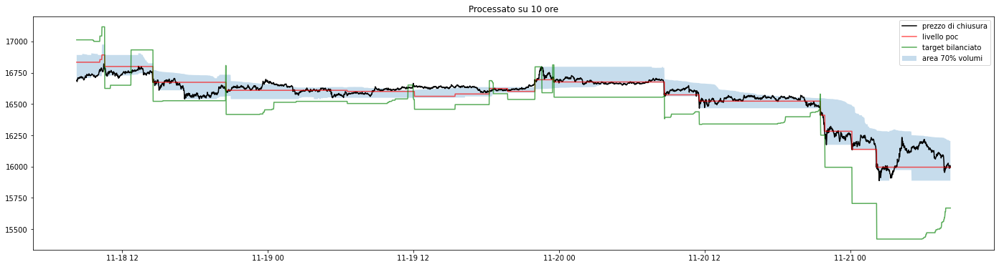

--------------------------------------------------
portafoglio: 22.69 -> 0.11%
vincite: 3.0 / 5.5 54.54%
--------------------------------------------------


--------------------------------------------------
                     14 / 17
--------------------------------------------------
addestramento su: 12 ore, partendo da 2022-11-06 14:42:08  portafoglio: -1155.04 -> -5.63% - vincite: 1 / 3 -> 33.33%


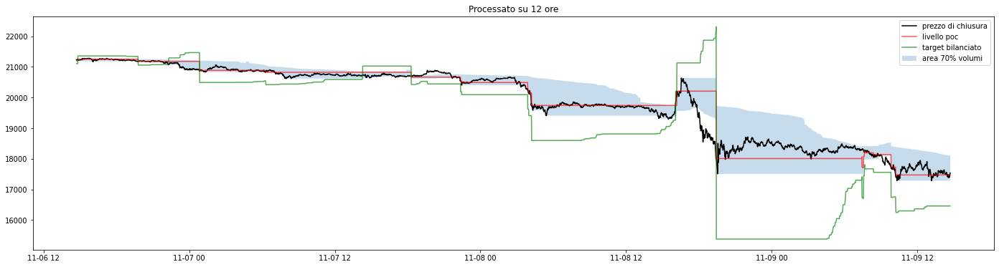

addestramento su: 12 ore, partendo da 2022-09-11 17:06:48  portafoglio: 489.66 -> 2.25% - vincite: 3 / 5 -> 60.0%


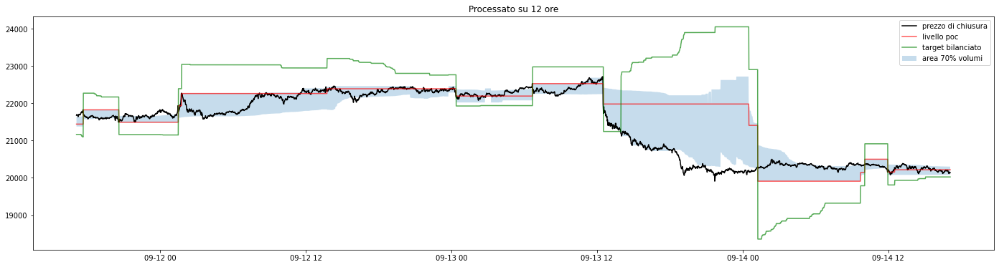

addestramento su: 12 ore, partendo da 2022-08-28 16:40:41  portafoglio: 162.39 -> 0.8% - vincite: 3 / 4 -> 75.0%


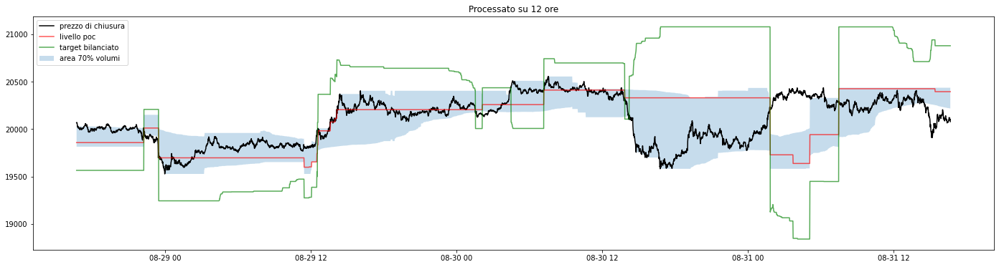

addestramento su: 12 ore, partendo da 2022-10-13 07:32:47  portafoglio: 137.79 -> 0.71% - vincite: 1 / 5 -> 20.0%


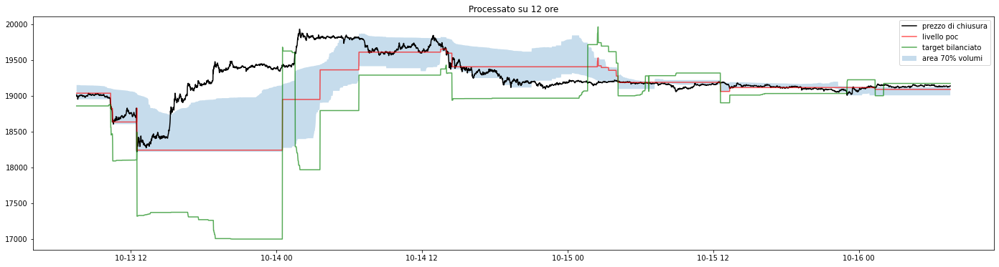

addestramento su: 12 ore, partendo da 2022-10-07 13:16:10  portafoglio: 211.93 -> 1.08% - vincite: 2 / 3 -> 66.66%


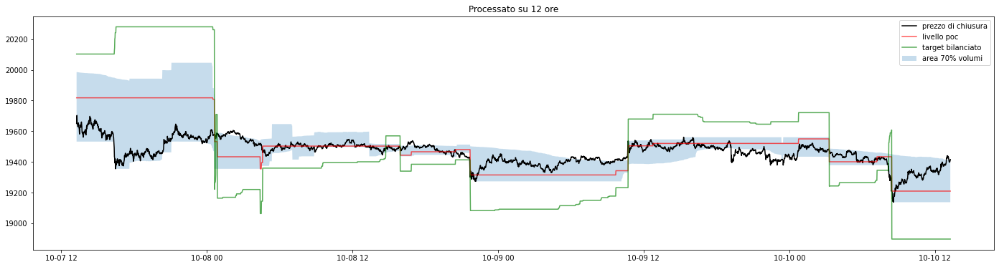

addestramento su: 12 ore, partendo da 2022-09-09 01:06:31  portafoglio: -2093.7 -> -9.79% - vincite: 1 / 3 -> 33.33%


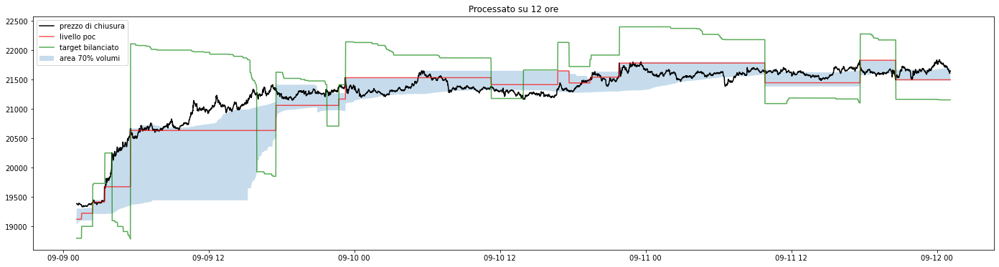

addestramento su: 12 ore, partendo da 2022-08-20 20:26:40  portafoglio: 1267.65 -> 5.93% - vincite: 5 / 6 -> 83.33%


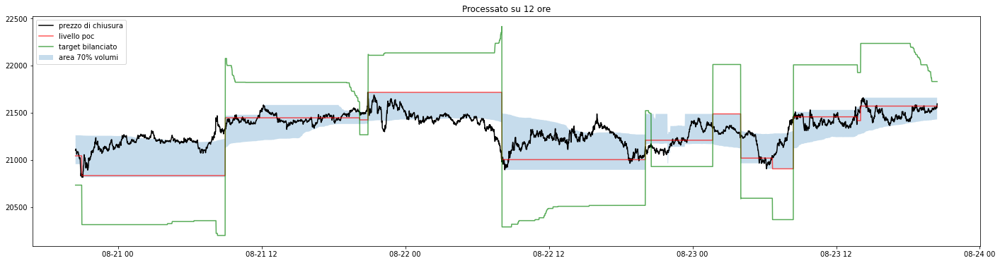

addestramento su: 12 ore, partendo da 2022-11-27 10:09:59  portafoglio: -425.39 -> -2.58% - vincite: 2 / 5 -> 40.0%


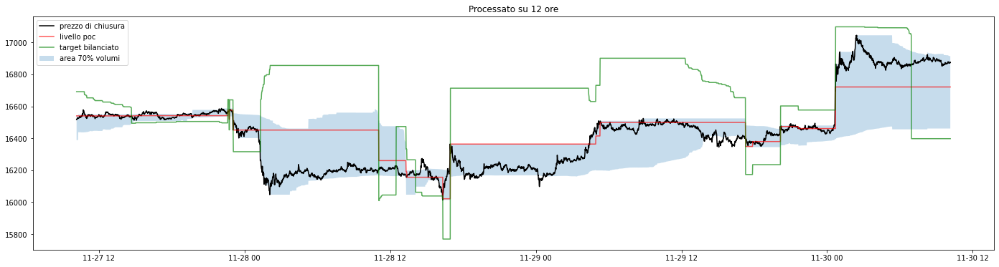

addestramento su: 12 ore, partendo da 2022-10-18 07:39:02  portafoglio: -146.61 -> -0.76% - vincite: 2 / 5 -> 40.0%


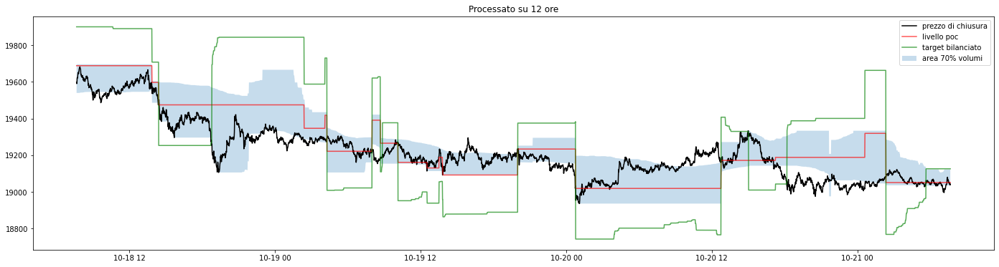

addestramento su: 12 ore, partendo da 2022-11-18 08:15:24  portafoglio: -587.84 -> -3.53% - vincite: 3 / 5 -> 60.0%


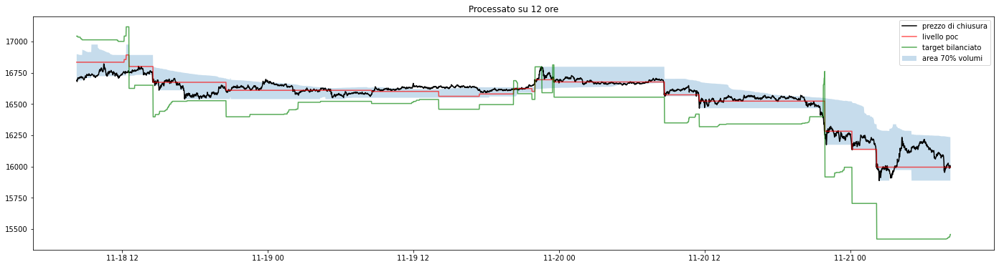

--------------------------------------------------
portafoglio: -213.91 -> -1.09%
vincite: 2.3 / 4.4 52.27%
--------------------------------------------------


--------------------------------------------------
                     15 / 17
--------------------------------------------------
addestramento su: 18 ore, partendo da 2022-11-06 14:42:08  portafoglio: -1485.96 -> -7.25% - vincite: 1 / 3 -> 33.33%


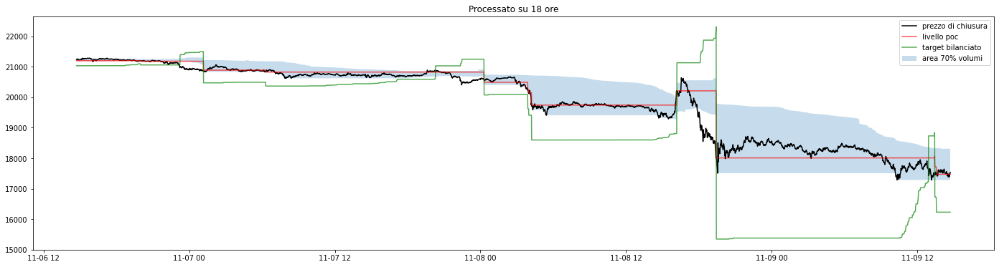

addestramento su: 18 ore, partendo da 2022-09-11 17:06:48  portafoglio: 81.39 -> 0.37% - vincite: 2 / 4 -> 50.0%


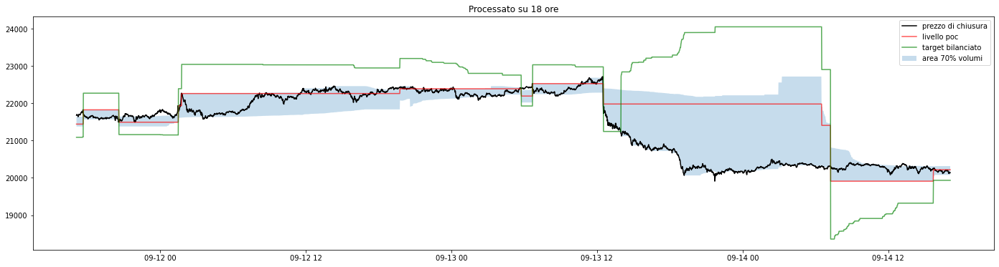

addestramento su: 18 ore, partendo da 2022-08-28 16:40:41  portafoglio: 674.35 -> 3.34% - vincite: 3 / 5 -> 60.0%


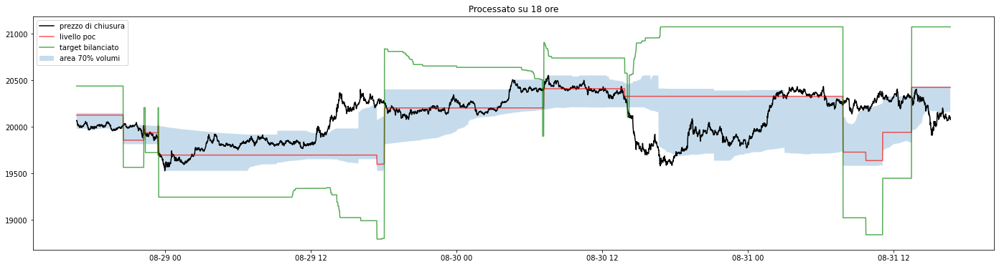

addestramento su: 18 ore, partendo da 2022-10-13 07:32:47  portafoglio: 252.43 -> 1.31% - vincite: 4 / 4 -> 100.0%


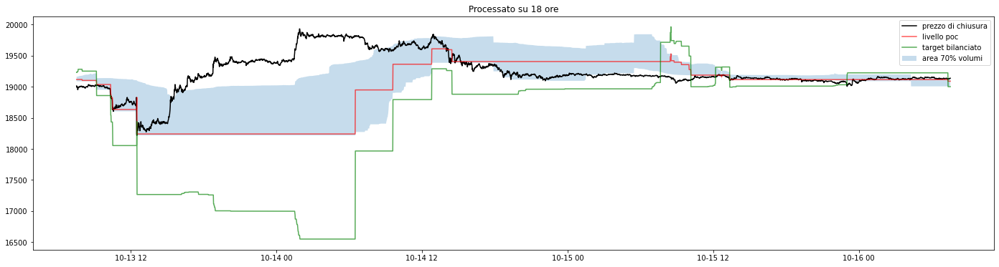

addestramento su: 18 ore, partendo da 2022-10-07 13:16:10  portafoglio: 218.79 -> 1.12% - vincite: 2 / 2 -> 100.0%


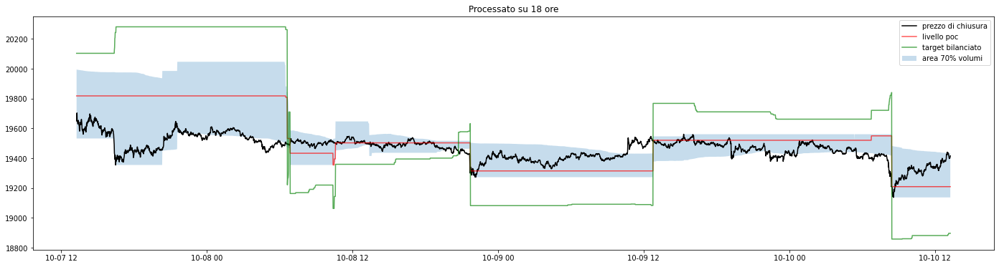

addestramento su: 18 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1791.43 -> -8.38% - vincite: 1 / 2 -> 50.0%


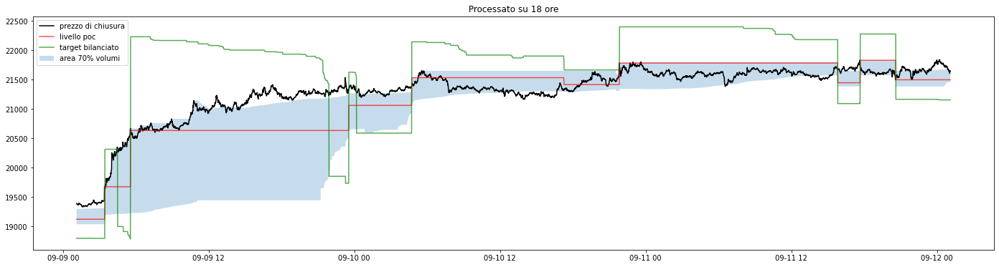

addestramento su: 18 ore, partendo da 2022-08-20 20:26:40  portafoglio: 890.82 -> 4.17% - vincite: 2 / 4 -> 50.0%


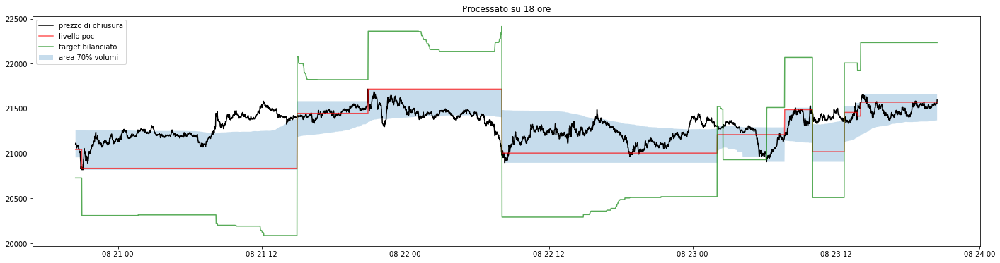

addestramento su: 18 ore, partendo da 2022-11-27 10:09:59  portafoglio: -696.76 -> -4.23% - vincite: 0 / 2 -> 0.0%


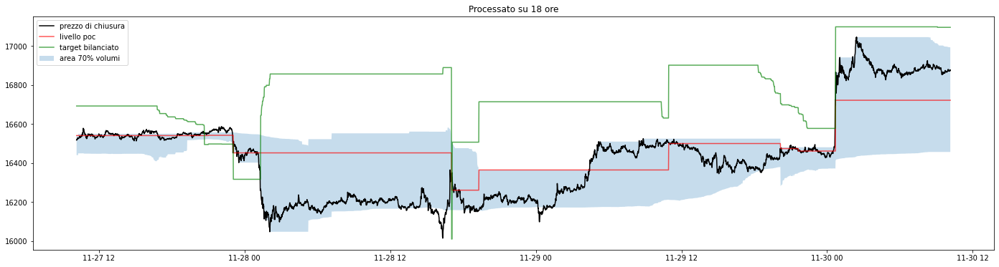

addestramento su: 18 ore, partendo da 2022-10-18 07:39:02  portafoglio: -303.32 -> -1.58% - vincite: 0 / 4 -> 0.0%


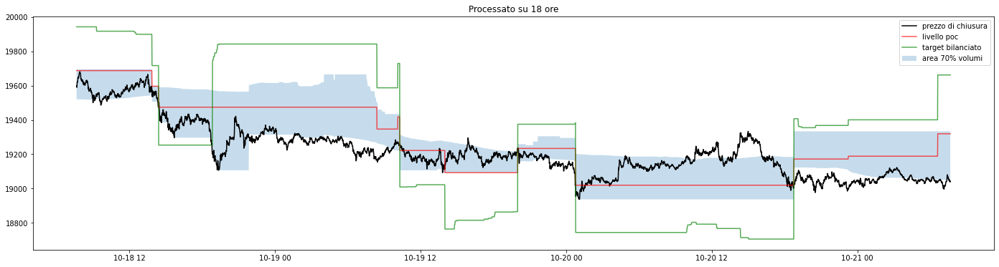

addestramento su: 18 ore, partendo da 2022-11-18 08:15:24  portafoglio: -490.61 -> -2.95% - vincite: 2 / 3 -> 66.66%


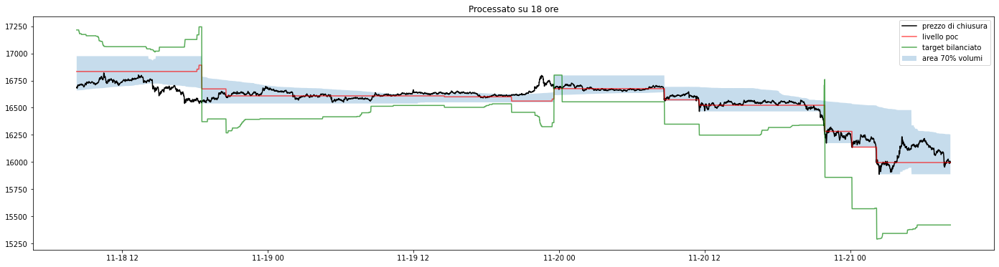

--------------------------------------------------
portafoglio: -265.03 -> -1.35%
vincite: 1.7 / 3.3 51.51%
--------------------------------------------------


--------------------------------------------------
                     16 / 17
--------------------------------------------------
addestramento su: 24 ore, partendo da 2022-11-06 14:42:08  portafoglio: -1563.73 -> -7.63% - vincite: 0 / 2 -> 0.0%


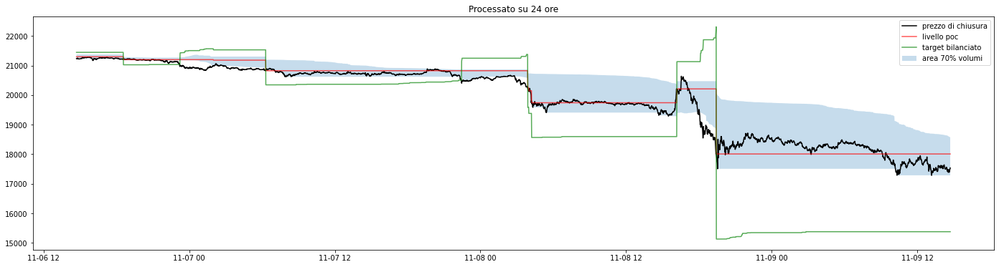

addestramento su: 24 ore, partendo da 2022-09-11 17:06:48  portafoglio: 497.12 -> 2.29% - vincite: 2 / 3 -> 66.66%


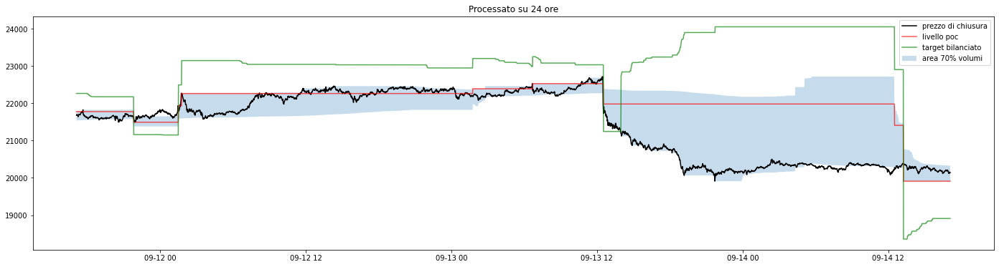

addestramento su: 24 ore, partendo da 2022-08-28 16:40:41  portafoglio: 332.79 -> 1.65% - vincite: 2 / 3 -> 66.66%


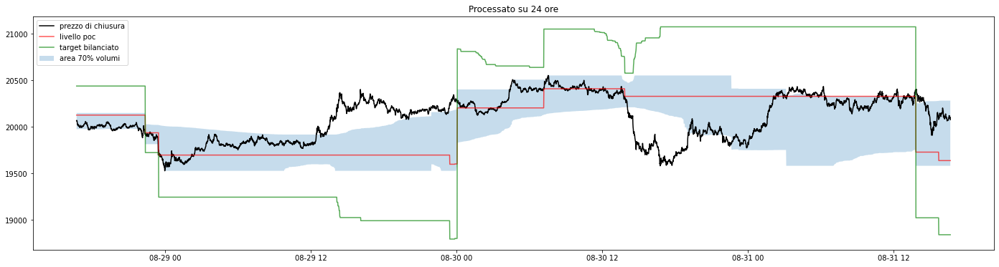

addestramento su: 24 ore, partendo da 2022-10-13 07:32:47  portafoglio: 800.87 -> 4.17% - vincite: 1 / 2 -> 50.0%


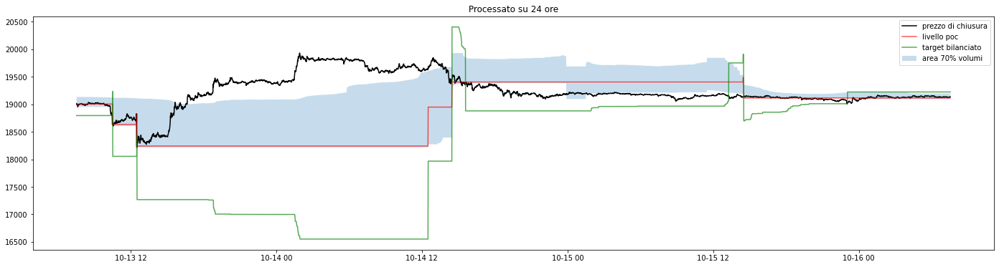

addestramento su: 24 ore, partendo da 2022-10-07 13:16:10  portafoglio: 212.84 -> 1.09% - vincite: 2 / 2 -> 100.0%


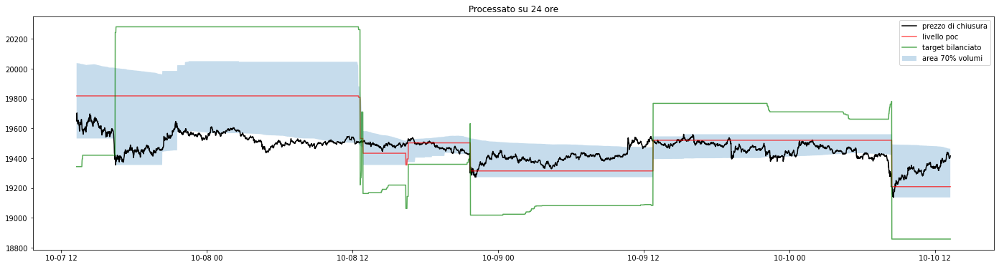

addestramento su: 24 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1906.0 -> -8.92% - vincite: 0 / 1 -> 0.0%


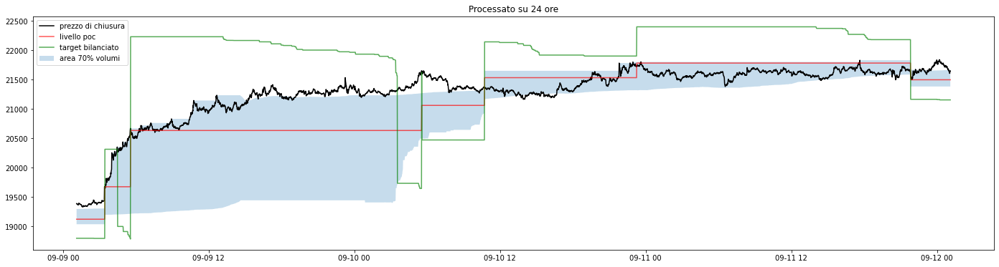

addestramento su: 24 ore, partendo da 2022-08-20 20:26:40  portafoglio: 586.22 -> 2.74% - vincite: 2 / 3 -> 66.66%


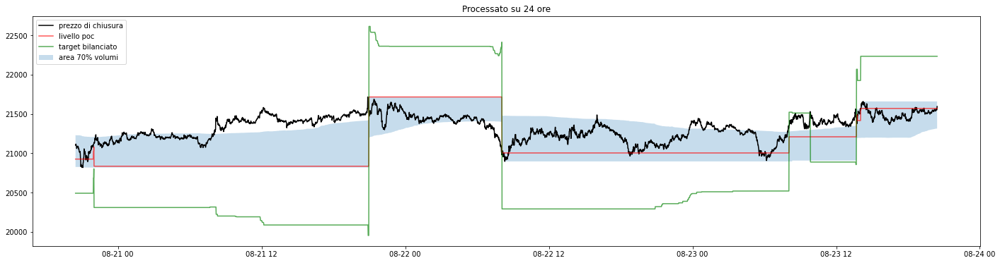

addestramento su: 24 ore, partendo da 2022-11-27 10:09:59  portafoglio: -784.4 -> -4.76% - vincite: 0 / 2 -> 0.0%


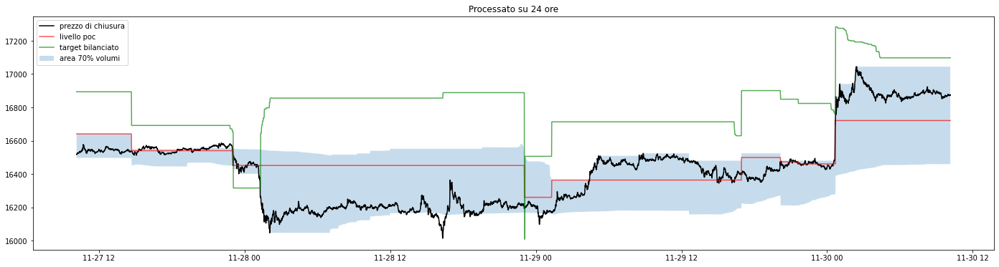

addestramento su: 24 ore, partendo da 2022-10-18 07:39:02  portafoglio: -453.77 -> -2.36% - vincite: 1 / 3 -> 33.33%


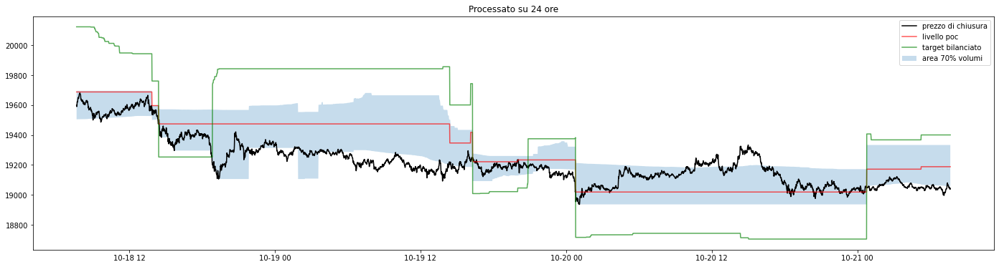

addestramento su: 24 ore, partendo da 2022-11-18 08:15:24  portafoglio: -605.56 -> -3.64% - vincite: 0 / 2 -> 0.0%


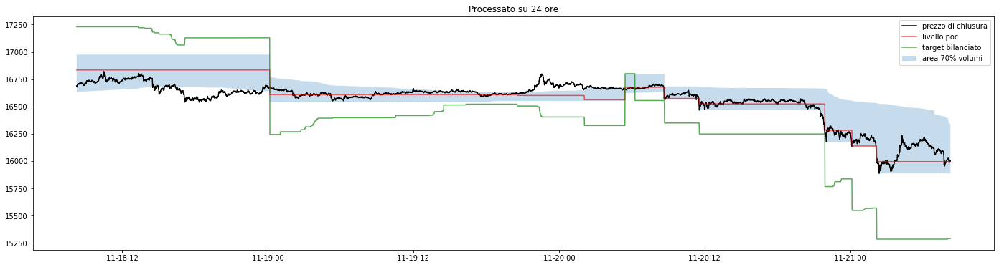

--------------------------------------------------
portafoglio: -288.36 -> -1.47%
vincite: 1.0 / 2.3 43.47%
--------------------------------------------------


--------------------------------------------------
                     17 / 17
--------------------------------------------------
addestramento su: 36 ore, partendo da 2022-11-06 14:42:08  portafoglio: -1064.4 -> -5.19% - vincite: 0 / 2 -> 0.0%


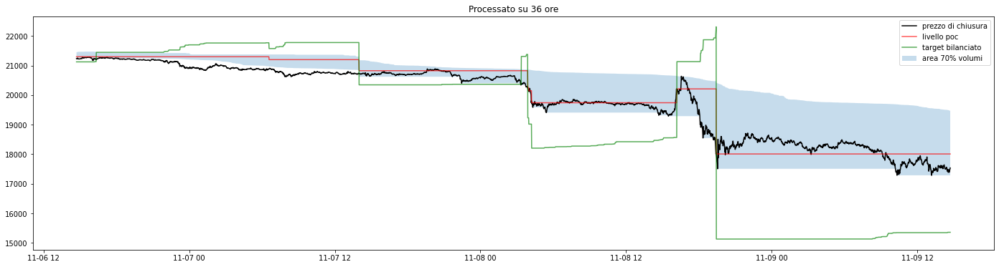

addestramento su: 36 ore, partendo da 2022-09-11 17:06:48  portafoglio: 113.17 -> 0.52% - vincite: 1 / 1 -> 100.0%


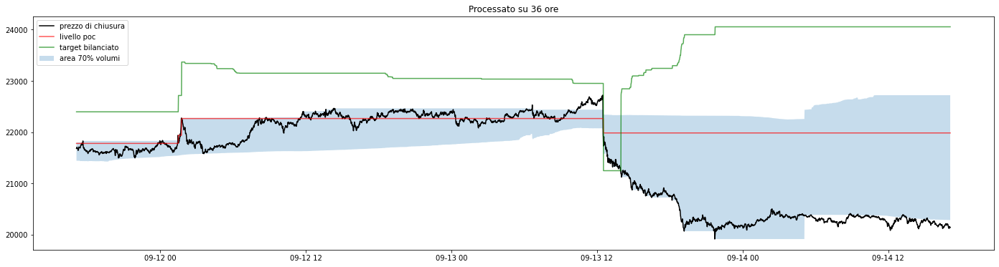

addestramento su: 36 ore, partendo da 2022-08-28 16:40:41  portafoglio: 358.37 -> 1.77% - vincite: 1 / 1 -> 100.0%


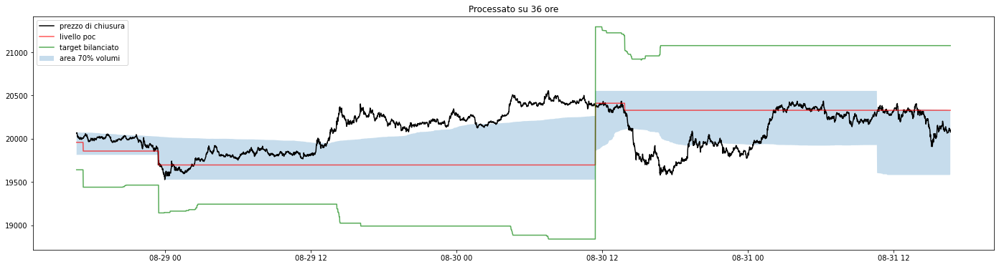

addestramento su: 36 ore, partendo da 2022-10-13 07:32:47  portafoglio: 815.56 -> 4.25% - vincite: 2 / 2 -> 100.0%


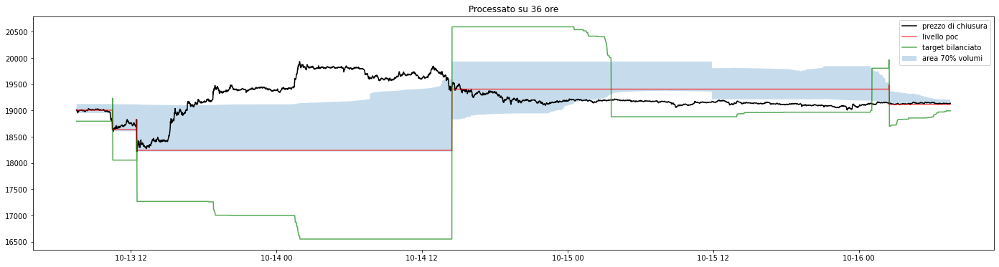

addestramento su: 36 ore, partendo da 2022-10-07 13:16:10  portafoglio: 327.77 -> 1.68% - vincite: 2 / 2 -> 100.0%


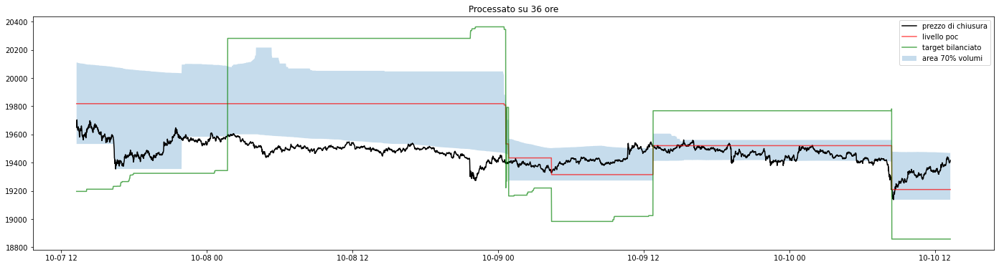

addestramento su: 36 ore, partendo da 2022-09-09 01:06:31  portafoglio: -1967.68 -> -9.2% - vincite: 0 / 1 -> 0.0%


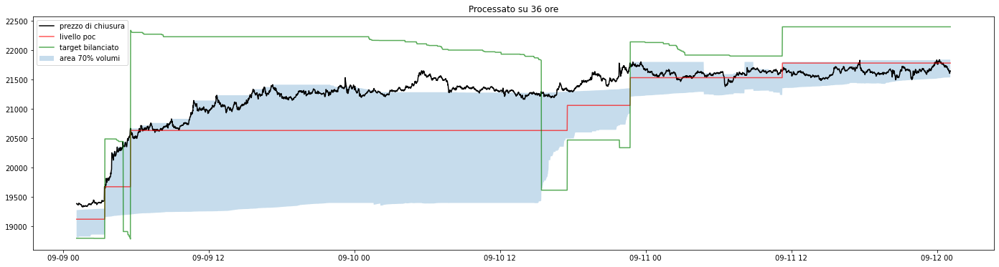

addestramento su: 36 ore, partendo da 2022-08-20 20:26:40  portafoglio: 449.62 -> 2.1% - vincite: 1 / 1 -> 100.0%


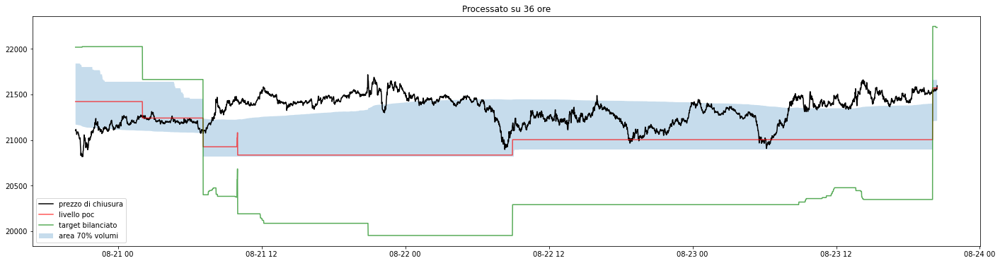

addestramento su: 36 ore, partendo da 2022-11-27 10:09:59  portafoglio: -110.68 -> -0.67% - vincite: 0 / 2 -> 0.0%


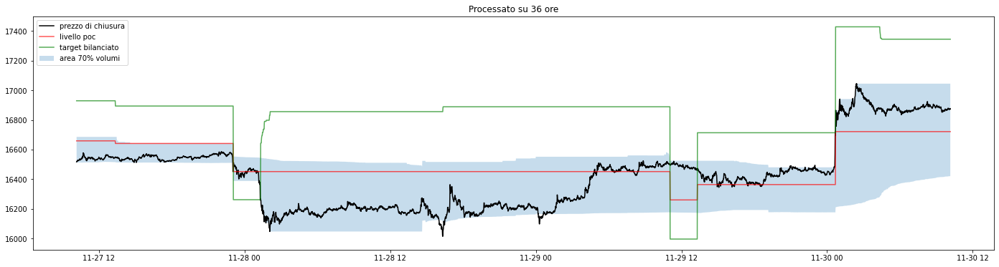

addestramento su: 36 ore, partendo da 2022-10-18 07:39:02  portafoglio: -20.1 -> -0.1% - vincite: 0 / 1 -> 0.0%


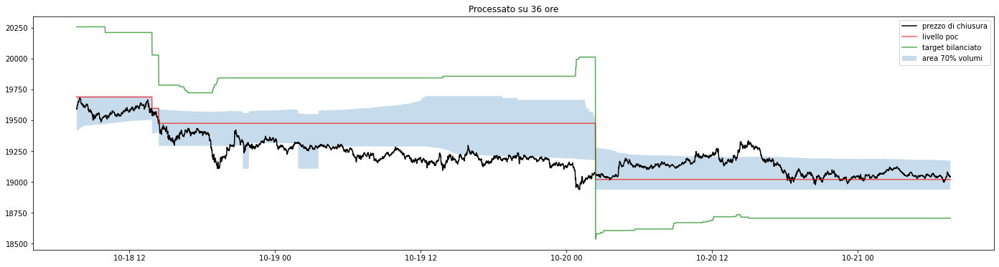

addestramento su: 36 ore, partendo da 2022-11-18 08:15:24  portafoglio: -649.06 -> -3.9% - vincite: 0 / 1 -> 0.0%


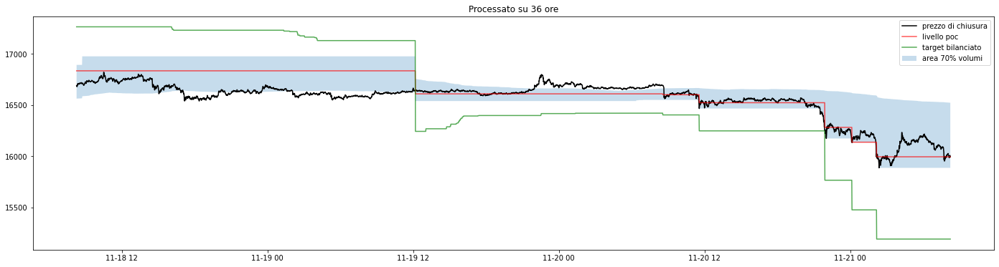

--------------------------------------------------
portafoglio: -174.74 -> -0.89%
vincite: 0.7 / 1.4 50.0%
--------------------------------------------------




In [6]:
# simulazione e raccolta dati

print('inizio simulazione su', len(ore_da_testare), 'configurazioni diverse.')
print('giorni per ogni singola simulazione:', giorni_simulazione, 'iniziando dalle date:', date_inizio_test)
for test_idx, ora_da_testare in enumerate(ore_da_testare):
    vincite_cnt = 0
    vincite_min = 9e99
    vincite_max = 0
    portafoglio_cnt = 0
    giocate_cnt = 0
    portafoglio_percentuale_cnt = 0
    portafoglio_min = 9e99
    portafoglio_max = 0
    print('-' * 50)
    print(' ' * 20, test_idx + 1, '/', len(ore_da_testare))
    print('-' * 50)
    for dt in date_inizio_test:
        data_inizio_test = dt
        print('addestramento su:', ora_da_testare, 'ore, partendo da', dt, ' ', end='')
        data_inizio_train = data_inizio_test - timedelta(hours=ora_da_testare)

        data_inizio_test_appo = data_inizio_test

        res = []
        actions = []
        position = 0
        for i in range(60 * 24 * giorni_simulazione):  # il dataset è di candele in M1
            mp = MarketProfile(candles[data_inizio_test - timedelta(days=15):data_inizio_test - timedelta(minutes=1)])
            mp_slice = mp[data_inizio_train:data_inizio_test - timedelta(minutes=1)]
            ultimo_prezzo_di_chiusura = candles[data_inizio_test:data_inizio_test + timedelta(minutes=1)].Close[0]
            res.append([
                ultimo_prezzo_di_chiusura,
                mp_slice.poc_price,
                mp_slice.balanced_target,
                mp_slice.value_area[0],
                mp_slice.value_area[1]
            ])
            data_inizio_test += timedelta(minutes=1)
            data_inizio_train += timedelta(minutes=1)

            # applicazione strategia
            if len(res) > 2:
                if res[-2][1] > res[-1][1] > res[-1][2]:
                    if position == 0:
                        position = 1
                        actions.append([ultimo_prezzo_di_chiusura, 1, np.nan])
                    elif position == -1:
                        actions[-1][2] = ultimo_prezzo_di_chiusura
                        position = 0
                if res[-2][1] < res[-1][1] < res[-1][2]:
                    if position == 0:
                        position = -1
                        actions.append([ultimo_prezzo_di_chiusura, -1, np.nan])
                    elif position == 1:
                        actions[-1][2] = ultimo_prezzo_di_chiusura
                        position = 0
        if np.isnan(actions[-1][2]):
            actions[-1][2] = ultimo_prezzo_di_chiusura

        # aggiornamento metriche
        portafoglio = 0
        vincite = 0
        for a in actions:
            result = (a[2] - a[0]) * a[1]
            portafoglio += result
            if result > 0:
                vincite += 1
        vincite_cnt += vincite
        portafoglio_cnt += portafoglio
        if vincite > vincite_max:
            vincite_max = vincite
        if vincite < vincite_min:
            vincite_min = vincite
        if portafoglio > portafoglio_max:
            portafoglio_max = portafoglio
        if portafoglio < portafoglio_min:
            portafoglio_min = portafoglio
        giocate_cnt += len(actions)
        rapporto_portafoglio = candles[data_inizio_test_appo:data_inizio_test - timedelta(minutes=1)].Close.median()
        portafoglio_percentuale_cnt += rapporto_portafoglio
        print('portafoglio:', int(portafoglio * 100) / 100, '-> ' + str(int((portafoglio / rapporto_portafoglio) * 10000) / 100) +'% - ', end='')
        print('vincite:', vincite, '/', len(actions), '-> ' + str(int((vincite / len(actions)) * 10000) / 100) + '%')

        # grafico custom dei segnali generati dai profili volumetrici analizzati
        xs = candles[data_inizio_test_appo:data_inizio_test].index
        plt.figure(figsize=(24, 6))
        plt.plot(xs, [x[0] for x in res], label='prezzo di chiusura', color='black')
        plt.plot(xs, [x[1] for x in res], label='livello poc', alpha=0.66, color='red')
        plt.plot(xs, [x[2] for x in res], label='target bilanciato', alpha=0.66, color='green')
        plt.fill_between(xs, y1=[x[3] for x in res], y2=[x[4] for x in res], label='area 70% volumi', alpha=0.25)
        plt.legend()
        plt.title('Processato su ' + str(ora_da_testare) + ' ore')
        plt.show()

    portafoglio = portafoglio_cnt / len(date_inizio_test)
    vincite = vincite_cnt / len(date_inizio_test)
    giocate_cnt /= int(len(date_inizio_test) * 100) / 100
    portafoglio_percentuale_cnt /= len(date_inizio_test)

    # riepilogo medie metriche sugli intervalli testati
    print('-' * 50)
    print('portafoglio:', int(portafoglio * 100) / 100, '->', str(int((portafoglio / portafoglio_percentuale_cnt) * 10000) / 100) +'%')
    print('vincite:', vincite, '/', giocate_cnt, str(int((vincite / giocate_cnt) * 10000) / 100) + '%')

    # aggiornamento log test effettuati
    dizionario_risultati['ore_di_addestramento'].append(ora_da_testare)
    dizionario_risultati['vincite'].append(vincite)
    dizionario_risultati['vincite_max'].append(vincite_max)
    dizionario_risultati['vincite_min'].append(vincite_min)
    dizionario_risultati['vincite_percentuale'].append(int((vincite / giocate_cnt) * 10000) / 100)
    dizionario_risultati['giocate'].append(giocate_cnt)
    dizionario_risultati['portafoglio'].append(portafoglio)
    dizionario_risultati['portafoglio_max'].append(portafoglio_max)
    dizionario_risultati['portafoglio_min'].append(portafoglio_min)
    dizionario_risultati['portafoglio_percentuale'].append(int((portafoglio / portafoglio_percentuale_cnt) * 10000) / 100)
    print('-' * 50)
    print('\n')

In [7]:
# creazione di un dataframe dal log dei risultati

df = pd.DataFrame(dizionario_risultati)

In [8]:
# visualizzazione dataframe

df.head(len(df))

,ore_di_addestramento,vincite,vincite_max,vincite_min,vincite_percentuale,giocate,portafoglio,portafoglio_max,portafoglio_min,portafoglio_percentuale
0,0.10,210.0,222,196,53.43,393.0,-253.514,905.66,-1233.15,-1.29
1,0.20,120.5,131,110,59.47,202.6,-91.688,1574.58,-2692.74,-0.46
2,0.33,76.4,91,69,59.17,129.1,-323.049,1438.06,-4060.83,-1.64
3,0.50,50.3,60,36,58.15,86.5,-283.296,645.27,-2528.97,-1.44
4,0.75,37.5,43,35,62.18,60.3,-5.565,441.84,-711.13,-0.02
5,1.00,31.0,34,27,66.52,46.6,-14.084,1043.77,-896.73,-0.07
6,1.50,20.5,25,15,61.56,33.3,219.480,1417.21,-711.82,1.12
7,2.00,15.8,19,11,61.96,25.5,338.504,1876.43,-1011.98,1.72
8,3.00,10.8,15,8,63.15,17.1,348.125,1858.86,-1046.13,1.77
9,4.00,8.0,14,5,59.25,13.5,300.225,1407.28,-1248.34,1.53


In [11]:
pickle.dump(df, open('log_df.pck', 'wb'))